## Intro

In [1]:
# Import Libraries 
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px
from sklearn.metrics import mean_absolute_error
from sklearn import metrics
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree
from sklearn.preprocessing import scale, normalize
!pip install dtreeviz
from dtreeviz.trees import dtreeviz
from sklearn import preprocessing
import seaborn as sns
from sklearn.utils import shuffle
from sklearn.model_selection import StratifiedShuffleSplit
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import numpy
from sklearn.tree import export_graphviz
import pydot
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from shapely.geos import lgeos
import fiona
from shapely.geometry import Polygon
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import csv
from sklearn.metrics import accuracy_score
from math import radians, cos, sin, asin, sqrt
#!pip install pygeos
#!pip install rtree
#!pip install geopandas
!pip install git+git://github.com/geopandas/geopandas.git

import geopandas
import pygeos
import rtree 


!pip install metpy
from metpy.interpolate import (interpolate_to_grid, remove_nan_observations,
                               remove_repeat_coordinates)

%matplotlib inline


/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.



  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-ugbpxev_
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-ugbpxev_
  Created wheel for geopandas: filename=geopandas-0.9.0+36.gcb88dd4-py2.py3-none-any.whl size=996489 sha256=54e21a6d355b95b7f722360ff020ea62b5b26a24015a4b919ad4d320bd9b5d5a
  Stored in directory: /tmp/pip-ephem-wheel-cache-xqfz3cnv/wheels/91/24/71/376c9c67192694168352afcccc2d264248f7e2cc6192997186
Successfully built geopandas


/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:110: UserWarning:

The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.



In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Open Earthchem dataset
df = pd.read_csv('/content/drive/MyDrive/earthchem_download_95122.txt', delimiter = "\t")
df

,SAMPLE ID,IGSN,SOURCE,REFERENCE,CRUISE ID,LATITUDE,LONGITUDE,LOC PREC,MIN AGE,AGE,MAX AGE,MATERIAL,TYPE,COMPOSITION,ROCK NAME,MINERAL,SIO2,TIO2,AL2O3,CR2O3,FE2O3,FE2O3T,FEO,FEOT,NIO,MNO,MGO,CAO,NA2O,K2O,P2O5,BAO,LOI,H2O,H2O_M,H2O_P,SO3,V2O3,ZNO,FE,...,INDIUM,K,LI,MG.1,MN.1,MO,NA,NB,NI.1,P,PB,PD,RB,RE,S.1,SB,SC,SE,SN,SR,TA,TE,TH,TI,TL,U,V,W,Y,ZN.1,ZR,TI.1,AS.2,AS.3,GER.1,H2O_M.1,H2O_P.1,H2O_M.2,H2O_P.2,INDIUM.1
0,080385-4,NaN,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",NaN,-41.1000,-72.4930,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,dacite,NaN,69.144,0.565,14.590,NaN,NaN,NaN,NaN,4.261,NaN,0.081,1.111,3.544,4.402,2.141,0.162,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,11,NaN,18.9,NaN,69.1,NaN,NaN,NaN,11.9,NaN,NaN,190.0,0.50,NaN,8.60,NaN,NaN,NaN,43.0,NaN,42.0,62,282.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,230483-3,NaN,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",NaN,-41.1000,-72.4930,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,dacite,NaN,63.541,0.796,16.427,NaN,NaN,NaN,NaN,5.973,NaN,0.121,1.732,5.136,4.562,1.460,0.252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,10,NaN,15.8,NaN,45.6,NaN,NaN,NaN,15.8,NaN,NaN,294.0,0.30,NaN,4.30,NaN,NaN,NaN,76.0,NaN,33.0,101,195.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PU-02-34,NaN,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",NaN,-40.5088,-72.2060,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,dacite,NaN,70.931,0.340,13.794,NaN,NaN,NaN,NaN,4.671,NaN,0.140,0.310,1.771,5.182,2.791,0.070,NaN,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,27,NaN,14.0,NaN,62.0,NaN,NaN,0.5,NaN,NaN,NaN,138.0,0.47,NaN,8.30,NaN,NaN,2.24,NaN,NaN,53.7,96,307.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PU-02-25,NaN,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",NaN,-40.5275,-72.1812,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,dacite,NaN,70.047,0.688,14.039,NaN,NaN,NaN,NaN,4.367,NaN,0.110,0.638,2.154,5.195,2.612,0.150,NaN,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.9,NaN,NaN,23.0,NaN,73.0,NaN,NaN,0.7,NaN,NaN,NaN,161.0,0.55,NaN,9.18,NaN,NaN,2.55,14.0,NaN,54.7,119,342.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,PU-02-20,NaN,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",NaN,-40.5675,-72.1743,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,dacite,NaN,69.367,0.531,14.150,NaN,NaN,NaN,NaN,5.167,NaN,0.150,0.471,2.213,5.167,2.664,0.120,NaN,< 0.16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.7,NaN,NaN,32.0,NaN,66.0,NaN,NaN,0.7,NaN,NaN,NaN,197.0,0.48,NaN,8.82,NaN,NaN,2.37,NaN,NaN,39.8,144,308.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3058,DBF-03-05,NaN,GEOROC,"HORA, J. M.; SINGER, B. S.; WÖRNER, G., 2007",NaN,-18.1958,-69.2527,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,dacite,NaN,64.904,0.834,16.277,NaN,NaN,NaN,NaN,3.854,NaN,0.061,1.801,3.835,4.568,3.540,0.326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3059,DBF04-6,NaN,GEOROC,"JICHA, B. R.; LAABS, B. J. C.; HORA, J. M.; SI...",NaN,-18.1928,-69.2434,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,rhyodacite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3060,DBF04-5,NaN,GEOROC,"JICHA, B. R.; LAABS, B. J. C.; HORA, J. M.; SI...",NaN,-18.1929,-69.2433,0.01,NaN,NaN,NaN,igneous,volcanic,felsic,rhyodacite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [4]:
# Drop Silica
df.dropna(subset=['SIO2'])

# Drop columns with less than 50% data 
limitPer = len(df) * .50
df = df.dropna(thresh=limitPer, axis=1)
df

,SAMPLE ID,SOURCE,REFERENCE,LATITUDE,LONGITUDE,LOC PREC,MATERIAL,TYPE,COMPOSITION,ROCK NAME,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR
0,080385-4,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",-41.1000,-72.4930,0.01,igneous,volcanic,felsic,dacite,69.144,0.565,14.590,4.261,0.081,1.111,3.544,4.402,2.141,0.162,550.0,69.1,190.0,8.60,282.0
1,230483-3,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",-41.1000,-72.4930,0.01,igneous,volcanic,felsic,dacite,63.541,0.796,16.427,5.973,0.121,1.732,5.136,4.562,1.460,0.252,396.0,45.6,294.0,4.30,195.0
2,PU-02-34,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5088,-72.2060,0.01,igneous,volcanic,felsic,dacite,70.931,0.340,13.794,4.671,0.140,0.310,1.771,5.182,2.791,0.070,747.0,62.0,138.0,8.30,307.0
3,PU-02-25,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5275,-72.1812,0.01,igneous,volcanic,felsic,dacite,70.047,0.688,14.039,4.367,0.110,0.638,2.154,5.195,2.612,0.150,776.0,73.0,161.0,9.18,342.0
4,PU-02-20,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5675,-72.1743,0.01,igneous,volcanic,felsic,dacite,69.367,0.531,14.150,5.167,0.150,0.471,2.213,5.167,2.664,0.120,692.0,66.0,197.0,8.82,308.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3058,DBF-03-05,GEOROC,"HORA, J. M.; SINGER, B. S.; WÖRNER, G., 2007",-18.1958,-69.2527,0.01,igneous,volcanic,felsic,dacite,64.904,0.834,16.277,3.854,0.061,1.801,3.835,4.568,3.540,0.326,NaN,NaN,NaN,NaN,NaN
3059,DBF04-6,GEOROC,"JICHA, B. R.; LAABS, B. J. C.; HORA, J. M.; SI...",-18.1928,-69.2434,0.01,igneous,volcanic,felsic,rhyodacite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3060,DBF04-5,GEOROC,"JICHA, B. R.; LAABS, B. J. C.; HORA, J. M.; SI...",-18.1929,-69.2433,0.01,igneous,volcanic,felsic,rhyodacite,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3061,CHO 099,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",-18.3014,-69.2431,0.01,igneous,volcanic,felsic,dacite,66.728,0.555,17.025,3.542,0.030,0.807,3.845,4.087,3.199,0.182,766.0,61.0,508.0,5.00,101.0


In [5]:
# Variables we are interested in ( except long/lat)
cluster_variables = ['SIO2', 'TIO2', 'AL2O3', 'FEOT', 'MNO', 'MGO',
       'CAO', 'NA2O', 'K2O', 'P2O5', 'BA', 'RB', 'SR', 'TH', 'ZR']
# All variables 
all_variables = ['LONGITUDE','LATITUDE','SIO2', 'TIO2', 'AL2O3', 'FEOT', 'MNO', 'MGO',
       'CAO', 'NA2O', 'K2O', 'P2O5', 'BA', 'RB', 'SR', 'TH', 'ZR']

# All the data
data_all = df.dropna()
# Coordinates
coordinates = data_all.loc[:,['LONGITUDE','LATITUDE']]
# Elemental data
X = data_all[cluster_variables]

data_all


,SAMPLE ID,SOURCE,REFERENCE,LATITUDE,LONGITUDE,LOC PREC,MATERIAL,TYPE,COMPOSITION,ROCK NAME,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR
0,080385-4,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",-41.1000,-72.4930,0.01,igneous,volcanic,felsic,dacite,69.144,0.565,14.590,4.261,0.081,1.111,3.544,4.402,2.141,0.162,550.0,69.1,190.0,8.60,282.0
1,230483-3,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",-41.1000,-72.4930,0.01,igneous,volcanic,felsic,dacite,63.541,0.796,16.427,5.973,0.121,1.732,5.136,4.562,1.460,0.252,396.0,45.6,294.0,4.30,195.0
2,PU-02-34,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5088,-72.2060,0.01,igneous,volcanic,felsic,dacite,70.931,0.340,13.794,4.671,0.140,0.310,1.771,5.182,2.791,0.070,747.0,62.0,138.0,8.30,307.0
3,PU-02-25,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5275,-72.1812,0.01,igneous,volcanic,felsic,dacite,70.047,0.688,14.039,4.367,0.110,0.638,2.154,5.195,2.612,0.150,776.0,73.0,161.0,9.18,342.0
4,PU-02-20,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5675,-72.1743,0.01,igneous,volcanic,felsic,dacite,69.367,0.531,14.150,5.167,0.150,0.471,2.213,5.167,2.664,0.120,692.0,66.0,197.0,8.82,308.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3055,RIG187,GEOROC,"DAVIDSON, J. P.; MCMILLAN, N. J.; MOORBATH, S....",-18.2458,-69.2194,0.01,igneous,volcanic,felsic,rhyolite,75.549,0.205,13.303,1.201,0.051,0.185,0.893,3.880,4.681,0.051,296.0,146.0,157.0,18.40,108.0
3056,AJO 017,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",-18.2167,-69.2125,0.01,igneous,volcanic,felsic,rhyolite,74.796,0.274,13.367,1.418,0.071,0.478,1.078,3.680,4.808,0.030,513.0,40.4,512.6,4.00,73.0
3057,AJO017,GEOROC,"DAVIDSON, J. P.; MCMILLAN, N. J.; MOORBATH, S....",-18.2458,-69.2194,0.01,igneous,volcanic,felsic,rhyolite,75.237,0.258,13.388,1.419,0.072,0.381,1.051,3.545,4.607,0.041,638.0,146.0,147.0,16.30,121.0
3061,CHO 099,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",-18.3014,-69.2431,0.01,igneous,volcanic,felsic,dacite,66.728,0.555,17.025,3.542,0.030,0.807,3.845,4.087,3.199,0.182,766.0,61.0,508.0,5.00,101.0


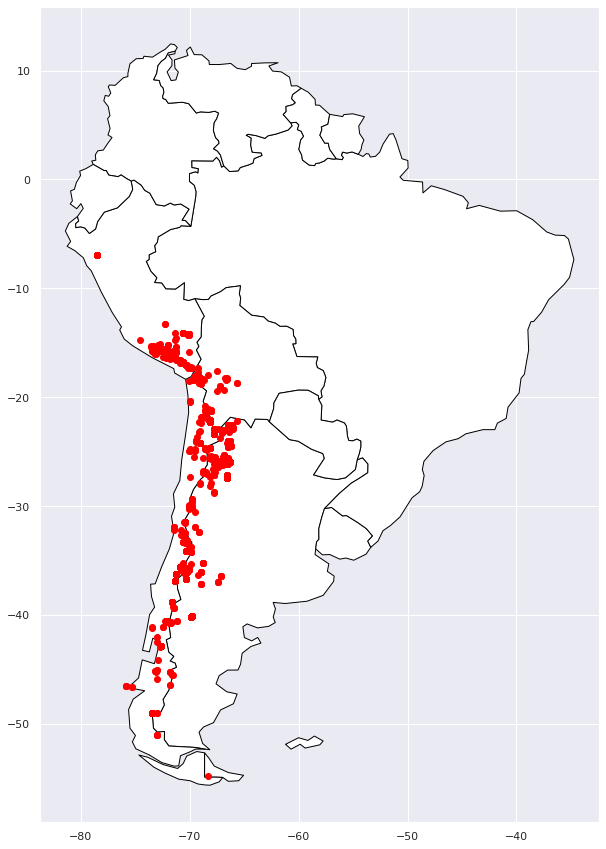

In [6]:
# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

plt.show()


# Clusters

## Salta, Argentina Cluster
Here, we will attempt to select samples near Salta, Argentina and try and predict whether or not they are geochemically different from other samples in South America. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

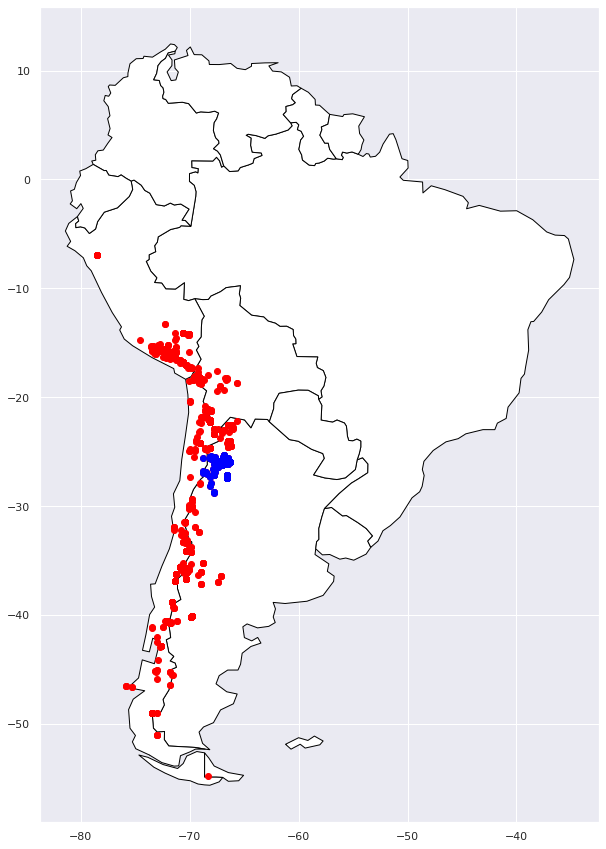

In [7]:
data_baby = df

# Defining the Salta Cluster Long/Lat
Salta_Cluster = data_all.loc[(data_all['LATITUDE'] <= -25) & (data_all['LATITUDE'] >= -29) ] 
Salta_Cluster = Salta_Cluster.loc[(Salta_Cluster['LONGITUDE'] <= -65) & (Salta_Cluster['LONGITUDE'] >= -69)]

# Mark samples in cluster with 'target'
Salta_Cluster['target'] = 1

# Create a Target and ID column
# Add target column to full dataset 
data_all["target"] = Salta_Cluster["target"].astype(float).astype(int)

# For all samples not from cluster: target = 0
data_all['target'] = data_all['target'].fillna(0)

# Add id number column to full dataset
# id number starts at 0 ******
data_all['id_number'] = data_all.index

# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

# Plot samples we are selecting to train/test
gdf = geopandas.GeoDataFrame(Salta_Cluster, geometry=geopandas.points_from_xy(Salta_Cluster['LONGITUDE'],Salta_Cluster['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='blue')
plt.show()


## Ica, Peru Cluster

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

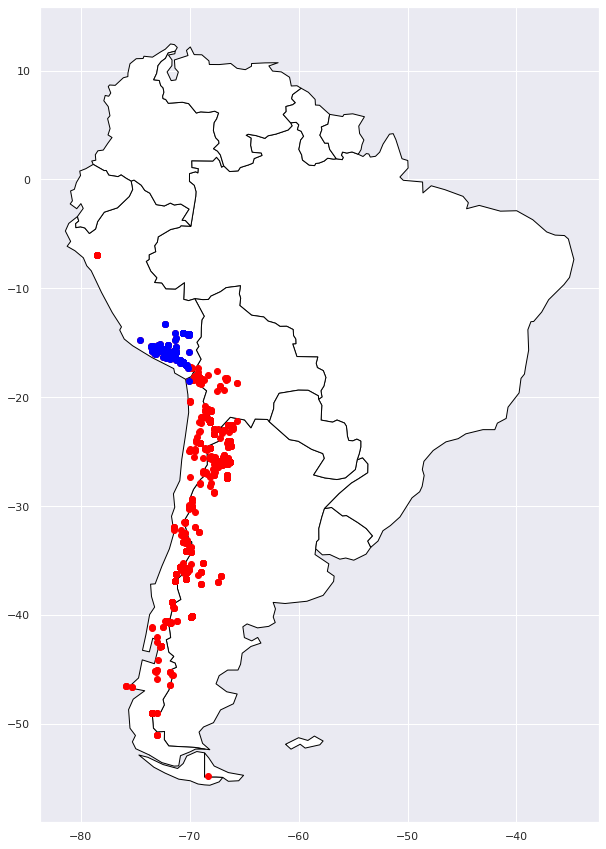

In [8]:

data_baby = df

# Defining the Ica, Peru cluster Long/Lat
Ica_Cluster = data_all.loc[(data_all['LATITUDE'] <= -13) & (data_all['LATITUDE'] >= -20) ] 
Ica_Cluster = Ica_Cluster.loc[(Ica_Cluster['LONGITUDE'] <= -70) & (Ica_Cluster['LONGITUDE'] >= -80)]

# Mark samples in cluster with 'target'
Ica_Cluster['target'] = 1

# Create a Target and ID column
# Add target column to full dataset 
data_all["target"] = Ica_Cluster["target"].astype(float).astype(int)

# For all samples not from cluster: target = 0
data_all['target'] = data_all['target'].fillna(0)

# Add id number column to full dataset
# id number starts at 0 ******
data_all['id_number'] = data_all.index

# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

# Plot samples we are selecting to train/test
gdf = geopandas.GeoDataFrame(Ica_Cluster, geometry=geopandas.points_from_xy(Ica_Cluster['LONGITUDE'],Ica_Cluster['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='blue')
plt.show()



_________________________________________________

## Zapala, Argentina Cluster

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

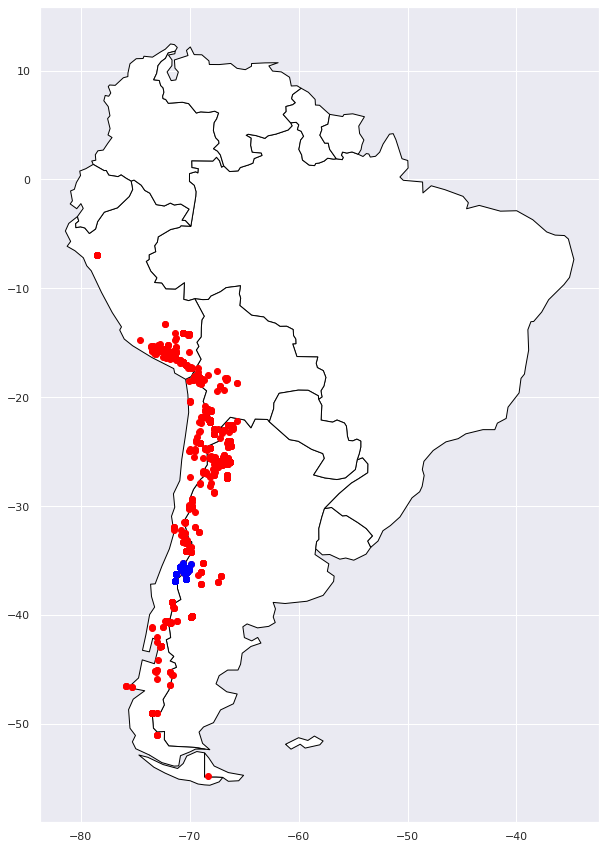

In [ ]:

data_baby = df

# Defining the Zapala Cluster Long/Lat
Zapala_Cluster = data_all.loc[(data_all['LATITUDE'] <= -35) & (data_all['LATITUDE'] >= -38) ] 
Zapala_Cluster = Zapala_Cluster.loc[(Zapala_Cluster['LONGITUDE'] <= -69.5) & (Zapala_Cluster['LONGITUDE'] >= -73)]

# Mark samples in cluster with 'target'
Zapala_Cluster['target'] = 1

# Create a Target and ID column
# Add target column to full dataset 
data_all["target"] = Zapala_Cluster["target"].astype(float).astype(int)

# For all samples not from cluster: target = 0
data_all['target'] = data_all['target'].fillna(0)

# Add id number column to full dataset
# id number starts at 0 ******
data_all['id_number'] = data_all.index


# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

# Plot samples we are selecting to train/test
gdf = geopandas.GeoDataFrame(Zapala_Cluster, geometry=geopandas.points_from_xy(Zapala_Cluster['LONGITUDE'],Zapala_Cluster['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='blue')
plt.show()

## Chaitén, Chile Cluster

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

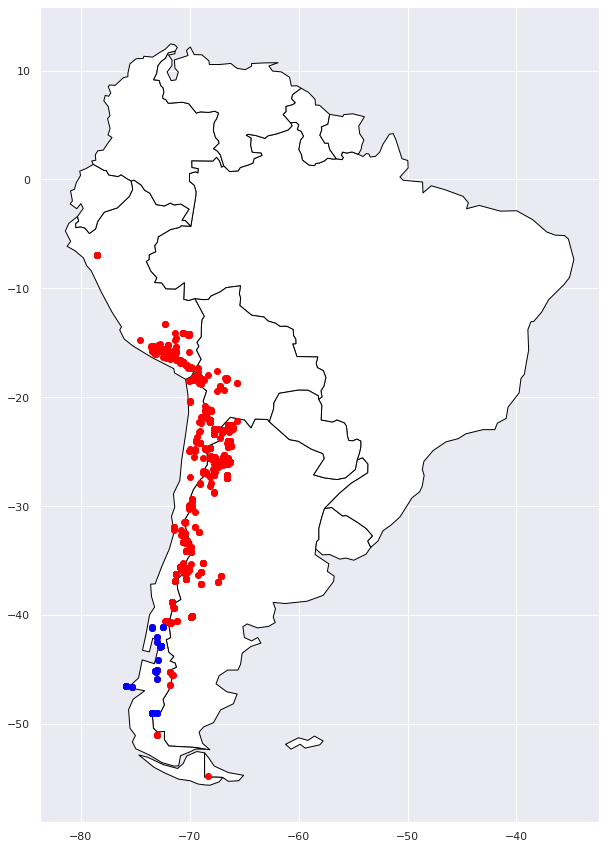

In [31]:

data_baby = df

# Defining the Ica, Peru cluster Long/Lat

Chaiten_Cluster = data_all.loc[(data_all['LATITUDE'] <= -41) & (data_all['LATITUDE'] >= -50) ] 
Chaiten_Cluster = Chaiten_Cluster.loc[(Chaiten_Cluster['LONGITUDE'] <= -72) & (Chaiten_Cluster['LONGITUDE'] >= -80)]



# Mark samples in cluster with 'target'
Chaiten_Cluster['target'] = 1

# Create a Target and ID column
# Add target column to full dataset 
data_all["target"] = Chaiten_Cluster["target"].astype(float).astype(int)

# For all samples not from cluster: target = 0
data_all['target'] = data_all['target'].fillna(0)

# Add id number column to full dataset
# id number starts at 0 ******
data_all['id_number'] = data_all.index


# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

# Plot samples we are selecting to train/test
gdf = geopandas.GeoDataFrame(Chaiten_Cluster, geometry=geopandas.points_from_xy(Chaiten_Cluster['LONGITUDE'],Chaiten_Cluster['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='blue')
plt.show()



## Testing - Longitude



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

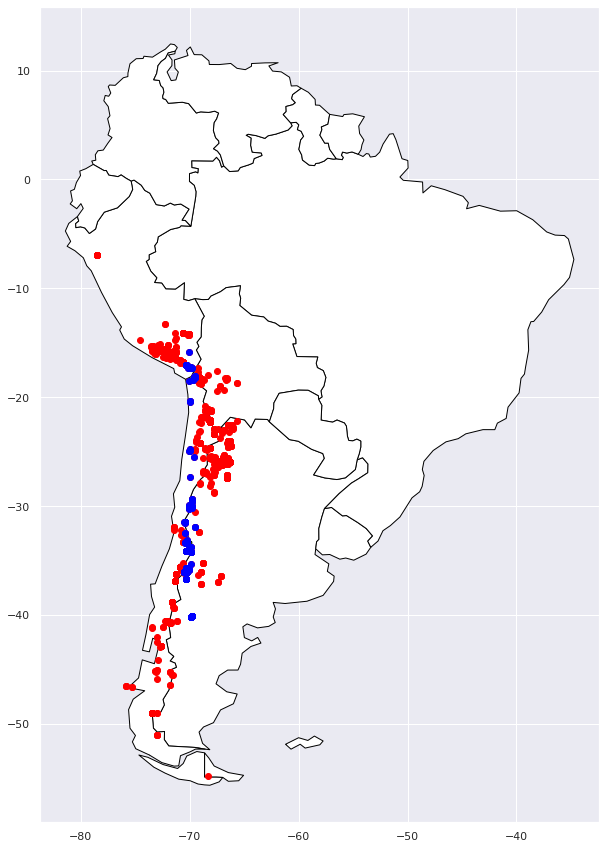

In [44]:

data_baby = df

# Defining the 69-70 Longitude cluster Long/Lat
Long_Cluster = data_all.loc[(data_all['LATITUDE'] <= -15) & (data_all['LATITUDE'] >= -55) ] 
Long_Cluster = Long_Cluster.loc[(Long_Cluster['LONGITUDE'] <= -69.5) & (Long_Cluster['LONGITUDE'] >= -70.5)]

# Mark samples in cluster with 'target'
Long_Cluster['target'] = 1

# Create a Target and ID column
# Add target column to full dataset 
data_all["target"] = Long_Cluster["target"].astype(float).astype(int)

# For all samples not from cluster: target = 0
data_all['target'] = data_all['target'].fillna(0)

# Add id number column to full dataset
# id number starts at 0 ******
data_all['id_number'] = data_all.index


# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

# Plot samples we are selecting to train/test
gdf = geopandas.GeoDataFrame(Long_Cluster, geometry=geopandas.points_from_xy(Long_Cluster['LONGITUDE'],Long_Cluster['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='blue')
plt.show()



## Testing - Latitude



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

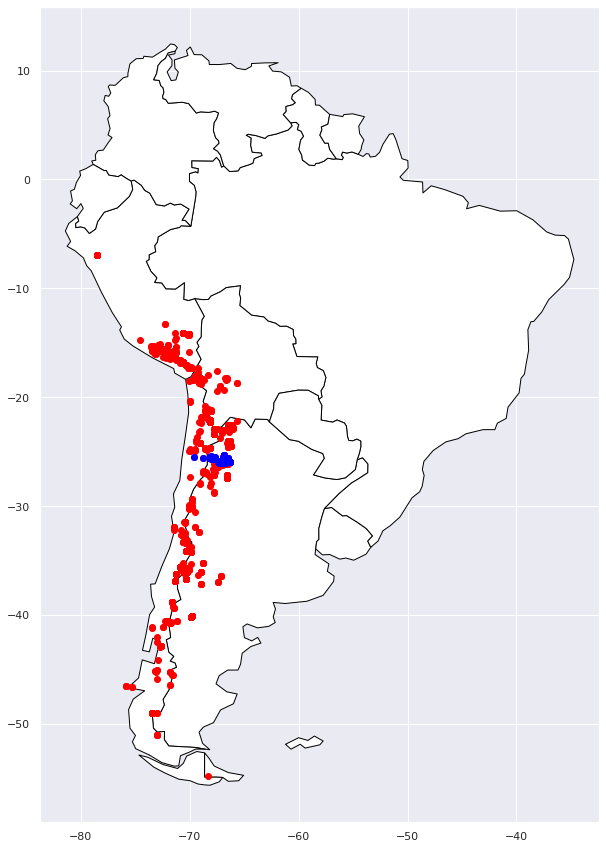

In [ ]:

data_baby = df

# Defining the 25-26 Latitude cluster Long/Lat
Lat_Cluster = data_all.loc[(data_all['LATITUDE'] <= -25) & (data_all['LATITUDE'] >= -26) ] 
Lat_Cluster = Lat_Cluster.loc[(Lat_Cluster['LONGITUDE'] <= -64) & (Lat_Cluster['LONGITUDE'] >= -70.5)]

# Mark samples in cluster with 'target'
Lat_Cluster['target'] = 1

# Create a Target and ID column
# Add target column to full dataset 
data_all["target"] = Lat_Cluster["target"].astype(float).astype(int)

# For all samples not from cluster: target = 0
data_all['target'] = data_all['target'].fillna(0)

# Add id number column to full dataset
# id number starts at 0 ******
data_all['id_number'] = data_all.index


# Plot all samples
gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')

# Plot samples we are selecting to train/test
gdf = geopandas.GeoDataFrame(Lat_Cluster, geometry=geopandas.points_from_xy(Lat_Cluster['LONGITUDE'],Lat_Cluster['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='blue')
plt.show()

# Body

In [8]:
# create new dictionary for id numbers -> show long/lat
locations = pd.DataFrame(data_all,index = data_all['id_number'], columns = ['LATITUDE', 'LONGITUDE'])

# Checking to see that we can call id_number to get correct Lat/Long values
print(locations.head())
print(' ')
print(locations.loc[4])

           LATITUDE  LONGITUDE
id_number                     
0          -41.1000   -72.4930
1          -41.1000   -72.4930
2          -40.5088   -72.2060
3          -40.5275   -72.1812
4          -40.5675   -72.1743
 
LATITUDE    -40.5675
LONGITUDE   -72.1743
Name: 4, dtype: float64


___________________________________

Plot Data: Red all the samples & Blue shows the selected samples we are training/testing 

In [9]:
# Seed data
np.random.seed(64)

# Select X and y variables

X = data_all[cluster_variables]#.astype(int)
y = data_all['target'].astype(int)


In [10]:
# How many values are in the minority cluster vs. the rest of the data? 
data_all['target'].value_counts()

# 0 = other places = 848 samples 
# 1 = minority cluster = 313 samples

0.0    848
1.0    313
Name: target, dtype: int64

In [11]:
# Selecting samples for train and testing 
# 50/50 - yes in cluster/no in cluster
# If a sample is in the Salta cluster, randomly select 120 samples
# If a sample is elsewhere, randomly select 120 samples 

# when target = 0, save in y_0
data_0 = data_all[data_all['target'].isin([0])]

# when target = 1 or in Salta, save in y_1
data_1 = data_all[data_all['target'].isin([1])]

# Shuffle both variables with target/ without target
data_0 = data_0.sample(frac = 1)
data_1 = data_1.sample(frac = 1)

data_1


,SAMPLE ID,SOURCE,REFERENCE,LATITUDE,LONGITUDE,LOC PREC,MATERIAL,TYPE,COMPOSITION,ROCK NAME,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,geometry,target,id_number
2989,CG 294,GEOROC,"FOLKES, C. B.; DE SILVA, S. L.; WRIGHT, H. M. ...",-25.8500,-66.8100,0.01,igneous,volcanic,felsic,rhyodacite,68.831,0.659,15.085,3.297,0.060,1.249,2.797,3.397,4.396,0.230,450.8,262.5,284.2,28.2,200.5,POINT (-66.81000 -25.85000),1.0,2989
2475,AR143,GEOROC,"RICHARDS, J. P.; ULLRICH, T. D.; KERRICH, R., ...",-25.6193,-67.7251,0.01,igneous,volcanic,felsic,rhyolite,76.360,0.113,13.204,0.691,0.051,0.194,1.167,3.460,4.719,0.041,519.0,203.0,135.0,22.3,54.0,POINT (-67.72510 -25.61930),1.0,2475
1663,SAL-H-14,GEOROC,"TRUMBULL, R. B.; WITTENBRINK, R.; HAHNE, K.; E...",-25.5278,-68.7611,0.01,igneous,volcanic,felsic,dacite,63.912,0.761,16.313,4.893,0.081,2.425,4.951,3.216,3.277,0.172,472.0,161.0,374.0,34.0,180.0,POINT (-68.76110 -25.52780),1.0,1663
1708,CG216,GEOROC,"WRIGHT, H. M. N.; FOLKES, C. B.; CAS, R. A. F....",-25.8731,-66.6655,0.01,igneous,volcanic,felsic,dacite,69.516,0.595,15.315,3.060,0.043,0.687,2.610,3.512,4.450,0.211,546.9,264.6,294.8,28.0,194.7,POINT (-66.66550 -25.87310),1.0,1708
2362,CG163,GEOROC,"WRIGHT, H. M. N.; FOLKES, C. B.; CAS, R. A. F....",-25.5742,-66.4738,0.01,igneous,volcanic,felsic,dacite,70.239,0.629,14.614,3.098,0.054,1.271,2.658,3.048,4.166,0.224,264.5,256.1,249.3,29.1,193.9,POINT (-66.47380 -25.57420),1.0,2362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,AR222,GEOROC,"RICHARDS, J. P.; ULLRICH, T. D.; KERRICH, R., ...",-25.5224,-68.0802,0.01,igneous,volcanic,felsic,dacite,66.034,0.672,15.763,4.059,0.071,2.077,4.338,3.554,3.269,0.163,633.0,123.0,438.0,11.8,114.0,POINT (-68.08020 -25.52240),1.0,2447
1574,51-48_2,GEOROC,"MÜLLER, D.; FORRESTAL, P., 1998",-27.4000,-66.6000,0.01,igneous,volcanic,felsic,dacite,70.234,0.315,9.273,11.734,0.074,0.967,0.957,0.473,5.961,0.011,487.0,74.0,158.0,1.0,72.0,POINT (-66.60000 -27.40000),1.0,1574
2775,CG 289A,GEOROC,"FOLKES, C. B.; DE SILVA, S. L.; WRIGHT, H. M. ...",-26.1338,-67.1399,0.01,igneous,volcanic,felsic,rhyodacite,69.479,0.520,15.295,2.799,0.050,1.170,2.699,2.699,5.098,0.190,511.8,256.8,271.5,19.7,139.4,POINT (-67.13990 -26.13380),1.0,2775
1597,45-61.3,GEOROC,"MÜLLER, D.; FORRESTAL, P., 1998",-27.4000,-66.6000,0.01,igneous,volcanic,felsic,dacite,67.884,0.518,15.546,3.521,0.041,1.596,1.420,1.793,7.421,0.259,520.0,143.0,270.0,8.1,137.0,POINT (-66.60000 -27.40000),1.0,1597


In [12]:
# Create train and test variables 

# split into train and test sets ( in the minoritiy data)
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(data_1[cluster_variables], data_1['target'], test_size=0.3, random_state=42)

# split into train and test sets ( in the majority data)
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(data_0[cluster_variables], data_0['target'], test_size=0.3, random_state=42)

# Add both target variables together - 120 samples per variable
y_train = pd.concat((y_train_1, y_train_0))
y_test = pd.concat((y_test_1, y_test_0))

# Get respective cluster variable values for X from y values
X_train = data_all.loc[y_train.index]
X_test = data_all.loc[y_test.index]

print(y_train)

2363    1.0
2457    1.0
210     1.0
2366    1.0
2973    1.0
       ... 
2552    0.0
1460    0.0
1421    0.0
1432    0.0
2585    0.0
Name: target, Length: 812, dtype: float64


In [13]:
X_train_0

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR
1025,70.532,0.511,14.515,3.045,0.051,1.707,2.883,2.545,4.017,0.194,466.000,172.0000,237.000,14.00000,123.000
662,67.508,0.747,15.769,3.407,0.111,0.929,2.554,5.593,3.160,0.222,727.175,84.2877,221.487,9.06348,274.415
1769,65.022,0.591,17.065,3.645,0.058,1.876,4.169,4.606,2.776,0.193,390.000,232.0000,63.000,30.00000,93.000
648,74.955,0.186,13.810,1.091,0.078,0.300,1.071,3.993,4.473,0.043,1178.000,112.0000,178.000,6.74000,70.000
289,69.418,0.771,14.505,4.327,0.130,0.571,2.434,5.069,2.624,0.150,674.000,68.4000,183.200,8.30000,338.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2552,71.354,0.356,15.694,1.873,0.031,1.193,1.674,2.950,4.624,0.251,526.000,356.0000,172.000,18.70000,134.000
1460,69.129,0.479,15.929,2.876,0.083,0.937,3.384,3.685,3.311,0.187,752.000,121.0000,362.000,9.00000,211.000
1421,70.025,0.522,14.172,3.278,0.060,1.686,3.242,3.101,3.794,0.120,593.000,162.0000,282.000,29.00000,146.000
1432,67.998,0.522,15.546,3.280,0.060,1.727,3.716,3.254,3.766,0.131,615.000,166.0000,318.000,28.00000,141.000


## SMOTE

In [14]:
# Initiate SMOTE (minority data)
sm = SMOTE(random_state = 42)
X_train_res, y_train_res = sm.fit_sample(X[cluster_variables], y)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



In [15]:
# Turn X_train_res into dataframe 
X_train_res = pd.DataFrame(X_train_res)

# reanming the DataFrame columns
X_train_res.columns = cluster_variables

# Add target column
X_train_res['target'] = y_train_res


In [16]:
X_train_res

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,target
0,69.144000,0.565000,14.590000,4.261000,0.081000,1.111000,3.544000,4.402000,2.141000,0.162000,550.000000,69.100000,190.000000,8.600000,282.000000,0
1,63.541000,0.796000,16.427000,5.973000,0.121000,1.732000,5.136000,4.562000,1.460000,0.252000,396.000000,45.600000,294.000000,4.300000,195.000000,0
2,70.931000,0.340000,13.794000,4.671000,0.140000,0.310000,1.771000,5.182000,2.791000,0.070000,747.000000,62.000000,138.000000,8.300000,307.000000,0
3,70.047000,0.688000,14.039000,4.367000,0.110000,0.638000,2.154000,5.195000,2.612000,0.150000,776.000000,73.000000,161.000000,9.180000,342.000000,0
4,69.367000,0.531000,14.150000,5.167000,0.150000,0.471000,2.213000,5.167000,2.664000,0.120000,692.000000,66.000000,197.000000,8.820000,308.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1691,67.382874,0.490668,14.474764,3.475277,0.045125,1.348453,3.625762,2.178882,6.759860,0.219681,532.028601,139.485699,384.597824,8.881321,140.861554,1
1692,75.470732,0.404840,12.714809,2.166928,0.029765,0.599029,1.932372,2.935134,3.636107,0.110045,897.208121,171.085441,290.879615,22.148750,155.554532,1
1693,63.973946,0.878835,15.950184,4.788250,0.070006,2.624515,4.751410,3.713559,3.006383,0.242011,818.988828,99.198883,576.210055,14.771843,223.635751,1
1694,71.952199,0.264598,14.749110,2.391487,0.172325,0.980893,1.586077,3.847286,3.971349,0.084432,99.856726,326.489703,74.479991,16.894538,60.160611,1


In [17]:
# Keep all dummy samples in minority data
# Drop all dummy samples in majority data
X_train_res.drop(X_train_res[X_train_res['target'] == 0].index, inplace = True)
y_train_res = X_train_res['target']

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

After OverSampling, the shape of train_X: (848, 16)
After OverSampling, the shape of train_y: (848,) 

After OverSampling, counts of label '1': 848
After OverSampling, counts of label '0': 0


In [18]:
# Smote dataset ( majority data + dummy minority data)

# X_train 
X_train_SMOTE = pd.concat((data_0[cluster_variables],X_train_res))
y_train_SMOTE = pd.concat((data_0['target'],y_train_res))

# Drop target column for X_train_SMOTE
X_train_SMOTE = X_train_SMOTE.drop(columns = 'target')


In [19]:
# SMOTE SVM? 


_____________________


## Feature Scaling

In [20]:
# Set variable for id number and coordinates
location = ['id_number', 'LATITUDE', 'LONGITUDE']

# Set temporary variable for location - X_Training
location_temp = X_train[location]

# Set temporary variable for location - X_Testing 
location_temp_X = X_test[location]

In [21]:
# Standardization (Z-score Normalization) 

In [22]:
# Z-score Normalization - X_Training
normalized_X_train=(X_train[cluster_variables]-X_train[cluster_variables].mean())/X_train[cluster_variables].std()
normalized_X_train_res=(X_train_res[cluster_variables]-X_train_res[cluster_variables].mean())/X_train_res[cluster_variables].std()


# Add back location data to normalized data - X_training 
normalized_X_train= pd.concat([normalized_X_train,
                               location_temp['id_number'],
                               location_temp['LATITUDE'],
                               location_temp['LONGITUDE']],
                               join = 'outer', axis = 1)
# Change name back to X_train
X_train = normalized_X_train
X_train_res = normalized_X_train_res
X_train.head()

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,id_number,LATITUDE,LONGITUDE
2363,-1.010020,0.747853,0.985819,0.790012,1.148610,1.870884,0.556077,-0.965214,0.164583,1.333135,-0.452916,0.182441,0.342103,1.189782,0.274342,2363,-25.8166,-66.3639
2457,-1.207720,0.909033,0.786264,0.794926,-0.057708,1.470698,1.379550,-0.445644,0.002771,0.197219,0.033261,-0.124237,0.166603,0.221972,0.023670,2457,-25.4809,-68.0527
210,-0.031327,0.120558,-0.130936,-0.215410,-0.620656,0.013965,-0.126168,-0.235223,0.808533,0.275946,-0.414492,1.068091,-0.254190,1.411329,-0.115163,210,-25.9800,-67.2100
2366,-0.736280,0.320944,0.772710,0.481785,0.746504,-0.053887,0.692236,-0.611188,0.649197,1.096954,-0.097432,0.312547,0.493115,0.641745,0.107227,2366,-25.8166,-66.3639
2973,0.123449,0.063927,-0.352329,-0.304578,-0.593849,-0.102352,-0.076919,-0.574290,0.933195,0.365919,-0.491862,1.327373,-0.257863,1.562914,-0.072099,2973,-25.8909,-66.8086


In [23]:
# Z-score Normalization - X_Testing
normalized_X_test= (X_test[cluster_variables]-X_train[cluster_variables].mean())/X_train[cluster_variables].std()

# Add back location data to normalized data - X_Testing
normalized_X_test= pd.concat([normalized_X_test,
                               location_temp_X['id_number'],
                               location_temp_X['LATITUDE'],
                               location_temp_X['LONGITUDE']],
                               join = 'outer', axis = 1)
# Change name back to X_test
X_test= normalized_X_test
X_test.head()

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,id_number,LATITUDE,LONGITUDE
2428,66.398,0.672,15.841,3.692,0.051,1.894,3.970,3.685,3.614,0.183,732.000,139.0,447.0,17.3000,149.000,2428,-25.5632,-67.9630
1542,66.911,0.582,15.546,3.621,0.082,1.777,3.646,3.554,4.065,0.214,562.100,160.3,473.1,26.9000,148.100,1542,-26.8481,-67.6858
1507,68.879,0.550,15.195,2.799,0.050,1.140,3.499,3.199,4.499,0.190,470.100,228.3,287.3,23.1000,151.200,1507,-25.9800,-67.2100
2770,70.554,0.635,14.649,3.222,0.051,1.204,2.372,2.812,4.319,0.183,415.776,271.0,266.0,31.0939,180.469,2770,-26.0478,-66.8898
2476,63.847,0.840,15.481,4.726,0.081,3.015,5.201,3.663,2.904,0.243,793.000,92.0,564.0,11.7000,194.000,2476,-25.6695,-67.8032


__________________________________________________

## Scatter Matrix Plots

- Training data
- Testing data

In [25]:
# Scatter Plot Matrix - on Training data
# geochemistry vs. each other
# colors show target: yellow = cluster; blue = other

features = cluster_variables

fig = px.scatter_matrix(
    X_train[cluster_variables],
    dimensions=features,
    color= y_train
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [26]:
# Scatter Plot Matrix - on Testing data
# geochemistry vs. each other
# colors show target: yellow = cluster; blue = other

features = cluster_variables

fig = px.scatter_matrix(
    X_test[cluster_variables],
    dimensions=features,
    color= y_test,
    
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [27]:
# Scatter Plot Matrix - on SMOTE Training data
# geochemistry vs. each other
# colors show target: yellow = cluster; blue = other

features = cluster_variables

fig = px.scatter_matrix(
    X_train_SMOTE[cluster_variables],
    dimensions=features,
    color= y_train_SMOTE
)
fig.update_traces(diagonal_visible=False)
fig.show()

# New Section

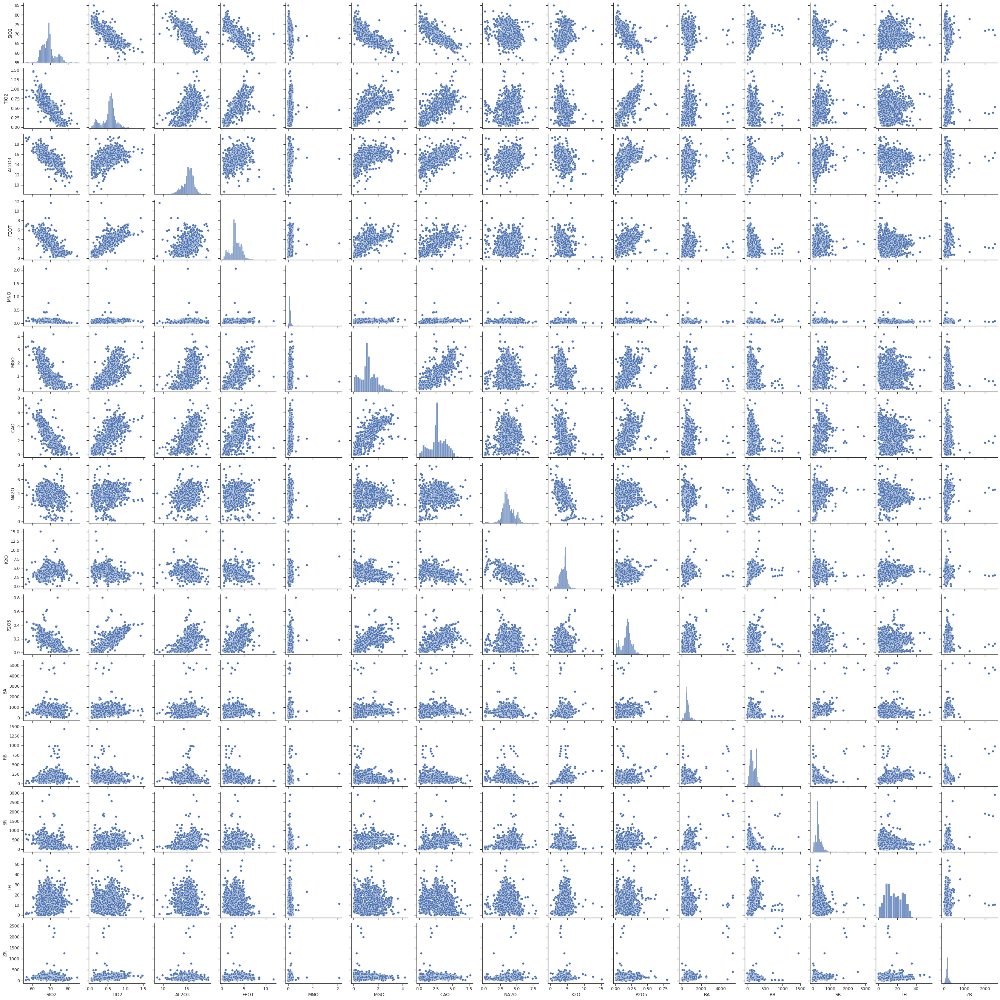

In [28]:
# Scatter plot of all SMOTE elements 
sns.set_theme(style="ticks")
sns.pairplot(X_train_SMOTE[cluster_variables])

___________________________

## PCA

1. scatter plot all of the principal components in training data
2. transformed PCA scatter
3. Variance vs. Components
4. SMOTE X_train_res

- From scatter plots, we see that it is dificult to cluster our target samples from the other samples. While there are regions where our target samples are located it isn't well seperated

- Transformed PCA doesn't seem to do much.

- There are around 2.5 number of components that explain the variance in the X_training data

In [29]:
# PCA - training data

pca = PCA()
pca.fit(X_train[cluster_variables])
X_pca = pca.transform(X_train[cluster_variables])
X_pca = pd.DataFrame(X_pca)
X_pca['target'] = y_train.values

print("original shape:   ", X_train.shape)
print("transformed shape:", X_pca.shape)

original shape:    (812, 18)
transformed shape: (812, 16)


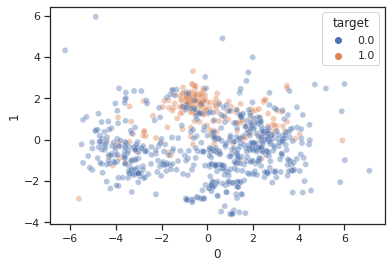

In [30]:
sns.scatterplot(x = 0, y=1,
                hue = 'target',
                data = X_pca,
                alpha = 0.4)

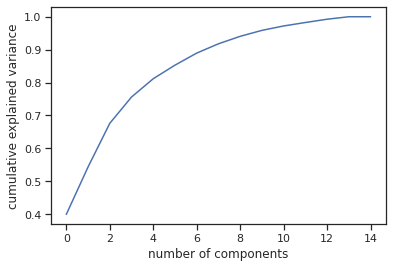

In [31]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

[Text(0, 0, 'SIO2'),
 Text(0, 0, 'TIO2'),
 Text(0, 0, 'AL2O3'),
 Text(0, 0, 'FEOT'),
 Text(0, 0, 'MNO'),
 Text(0, 0, 'MGO'),
 Text(0, 0, 'CAO'),
 Text(0, 0, 'NA2O'),
 Text(0, 0, 'K2O'),
 Text(0, 0, 'P2O5'),
 Text(0, 0, 'BA'),
 Text(0, 0, 'RB'),
 Text(0, 0, 'SR'),
 Text(0, 0, 'TH'),
 Text(0, 0, 'ZR')]

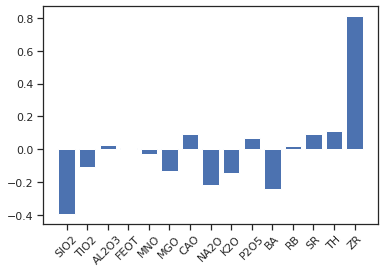

In [32]:
# PCA 1st components plot

fig,ax = plt.subplots()
ax.bar([x for x in range(len(pca.components_[:,0]))], pca.components_[:,0])
ax.set_xticks(np.arange(15))
ax.set_xticklabels(cluster_variables,rotation=45)

[Text(0, 0, 'SIO2'),
 Text(0, 0, 'TIO2'),
 Text(0, 0, 'AL2O3'),
 Text(0, 0, 'FEOT'),
 Text(0, 0, 'MNO'),
 Text(0, 0, 'MGO'),
 Text(0, 0, 'CAO'),
 Text(0, 0, 'NA2O'),
 Text(0, 0, 'K2O'),
 Text(0, 0, 'P2O5'),
 Text(0, 0, 'BA'),
 Text(0, 0, 'RB'),
 Text(0, 0, 'SR'),
 Text(0, 0, 'TH'),
 Text(0, 0, 'ZR')]

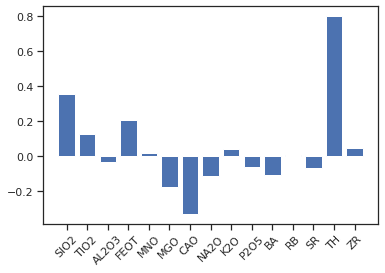

In [33]:
# PCA 2nd components plot

fig,ax = plt.subplots()
ax.bar([x for x in range(len(pca.components_[:,1]))], pca.components_[:,1])
ax.set_xticks(np.arange(15))
ax.set_xticklabels(cluster_variables,rotation=45)

In [34]:
y_train_SMOTE

1423    0.0
159     0.0
2575    0.0
2403    0.0
2896    0.0
       ... 
1691    1.0
1692    1.0
1693    1.0
1694    1.0
1695    1.0
Name: target, Length: 1696, dtype: float64

In [35]:
# PCA - SMOTE training data


pca = PCA()
pca.fit(X_train_SMOTE[cluster_variables])
X_pca_SMOTE = pca.transform(X_train_SMOTE[cluster_variables])
X_pca_SMOTE = pd.DataFrame(X_pca_SMOTE)

X_pca_SMOTE['target'] = y_train_SMOTE.values



print(' ')
print("original shape:   ", X_train_SMOTE.shape)
print("transformed shape:", X_pca_SMOTE.shape)

 
original shape:    (1696, 15)
transformed shape: (1696, 16)


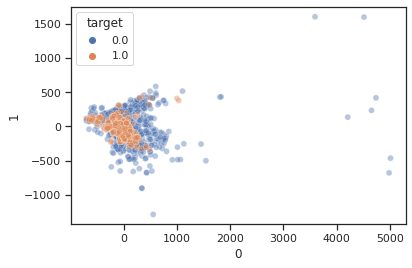

In [36]:
sns.scatterplot(x = 0, y=1,
                hue = X_pca_SMOTE['target'],
                data = X_pca_SMOTE,
                alpha = 0.4)

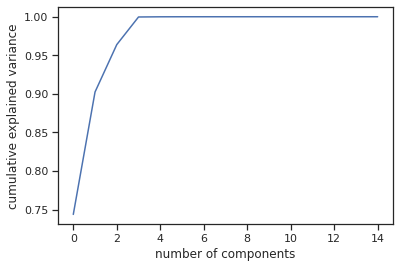

In [37]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

__________________________________________

## RandomForestClassifier

- X_train
- Second time X_train
- X_test
- Long on y_train
- Lat on y_train

Feature Importance: 
1. Variable: RB                   Importance: 0.19
2. Variable: NA2O                 Importance: 0.17
3. Variable: TH                   Importance: 0.15
4. Variable: K2O                  Importance: 0.07
  
- Consistantly, RB, NA2O, TH, and K2O are the top four most important features. Although for each training set, they might be at a different level of importance. They still remain the top 4 important variables 

- Randomforest on Latitude is more accurate than Longitude


In [38]:
# RandomForestClassifier - Inital with X_train

scores = []
  
# using regression to get predicted data
rf = RandomForestClassifier(n_estimators=100, max_depth=2)

#for train_index, test_index in sss.split(X, y):
 #   X_train, X_test = X[train_index], X[test_index]
 #   y_train, y_test = y.iloc[train_index], y.iloc[test_index]
rf.fit(X_train[cluster_variables], y_train)
pred = rf.predict(X_test[cluster_variables])
scores.append(accuracy_score(y_test, pred))
  
# get accurracy of each prediction
print(scores)
print(' ')

# Confusion matrix: RandomForestClassifier - Inital with X_train
cnf_matrix = metrics.confusion_matrix(y_test, pred)
print(cnf_matrix)

[0.7306590257879656]
 
[[254   1]
 [ 93   1]]


Here, we see that we get an accurracy score of ~80- 91%

In [39]:
# Saving feature names for later use
feature_list = list(cluster_variables)

# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];


Variable: TH                   Importance: 0.25
Variable: RB                   Importance: 0.17
Variable: K2O                  Importance: 0.11
Variable: NA2O                 Importance: 0.1
Variable: TIO2                 Importance: 0.06
Variable: MGO                  Importance: 0.06
Variable: MNO                  Importance: 0.05
Variable: ZR                   Importance: 0.05
Variable: P2O5                 Importance: 0.04
Variable: SIO2                 Importance: 0.03
Variable: SR                   Importance: 0.03
Variable: FEOT                 Importance: 0.02
Variable: CAO                  Importance: 0.02
Variable: BA                   Importance: 0.02
Variable: AL2O3                Importance: 0.0


In [40]:
# RandomForestClassifier - with X_test

scores = []
  
# using regression to get predicted data
rf = RandomForestClassifier(n_estimators=100, max_depth=2)

#for train_index, test_index in sss.split(X, y):
 #   X_train, X_test = X[train_index], X[test_index]
 #   y_train, y_test = y.iloc[train_index], y.iloc[test_index]
rf.fit(X_test[cluster_variables], y_test)
pred = rf.predict(X_test[cluster_variables])
scores.append(accuracy_score(y_test, pred))
  
# get accurracy of each prediction
print(scores)
print(' ')

# Confusion matrix: RandomForestClassifier - with X_test
cnf_matrix = metrics.confusion_matrix(y_test, pred)
print(cnf_matrix)

[0.8882521489971347]
 
[[253   2]
 [ 37  57]]


In [41]:
# RandomForestClassifier - Long on y_train

scores = []
  
# using regression to get predicted data
rf = RandomForestClassifier(n_estimators=100, max_depth=2)

#for train_index, test_index in sss.split(X, y):
 #   X_train, X_test = X[train_index], X[test_index]
 #   y_train, y_test = y.iloc[train_index], y.iloc[test_index]

#X_test_std = X_test_std.values.reshape(-1,1)

rf.fit(X_train['LONGITUDE'].values.reshape(-1,1), y_train)
pred = rf.predict(X_test['LONGITUDE'].values.reshape(-1,1))
scores.append(accuracy_score(y_test, pred))
  
# get accurracy of each prediction
print(scores)
print(' ')

# Confusion matrix: RandomForestClassifier - with X_test
cnf_matrix = metrics.confusion_matrix(y_test, pred)
print(cnf_matrix)

[0.9083094555873925]
 
[[231  24]
 [  8  86]]


In [42]:
# RandomForestClassifier - Lat on y_train

scores = []
  
# using regression to get predicted data
rf = RandomForestClassifier(n_estimators=100, max_depth=2)

#for train_index, test_index in sss.split(X, y):
 #   X_train, X_test = X[train_index], X[test_index]
 #   y_train, y_test = y.iloc[train_index], y.iloc[test_index]

rf.fit(X_train['LATITUDE'].values.reshape(-1,1), y_train)
pred = rf.predict(X_test['LATITUDE'].values.reshape(-1,1))
scores.append(accuracy_score(y_test, pred))
  
# get accurracy of each prediction
print('Accurracy of each prediction:  ',scores)
print(' ')

# Confusion matrix: RandomForestClassifier - with X_test
cnf_matrix = metrics.confusion_matrix(y_test, pred)
print(cnf_matrix)

Accurracy of each prediction:   [1.0]
 
[[255   0]
 [  0  94]]


- Randomforest on Latitude is more accurate than Longitude

________________

##RandomForestRegression

- Geochemistry
- Latitude
- Longitude


Feature Importance for RandomForestRegression: 
1. Variable: ZR                   Importance: 0.27
2. Variable: TH                   Importance: 0.24
3. Variable: SR                   Importance: 0.13
4. Variable: RB                   Importance: 0.7

For geochemistry, Longitude, and Latitude these four elements are the most important. Some elements are different from the RandomForestClassifier. The elements that overlap include TH and RB. 


Mean Absolute Error: 0.43766475644699143
Mean Squared Error: 0.20507040401146132
Root Mean Squared Error: 0.45284699845694165
 
Accuracy: -0.04204339920734257


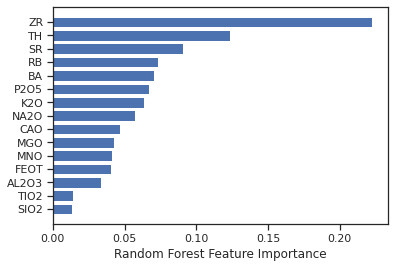

In [43]:
# RandomForestRegression - on geochemistry

# Fitting Random Forest Regression to the Training set
regressor = RandomForestRegressor(n_estimators = 1000, random_state = 42)
regressor.fit(X_train[cluster_variables], y_train)

# Predicting the Test set results
y_pred = regressor.predict(X_test[cluster_variables])

# Evaluating the Algorithm
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Bar plot important features
sorted_idx = regressor.feature_importances_.argsort()
plt.barh(cluster_variables, regressor.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

print(' ')
print("Accuracy:", regressor.score(X_test[cluster_variables], y_test))


In [44]:
X_test

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,id_number,LATITUDE,LONGITUDE
2428,66.398,0.672,15.841,3.692,0.051,1.894,3.970,3.685,3.614,0.183,732.000,139.0,447.0,17.3000,149.000,2428,-25.5632,-67.9630
1542,66.911,0.582,15.546,3.621,0.082,1.777,3.646,3.554,4.065,0.214,562.100,160.3,473.1,26.9000,148.100,1542,-26.8481,-67.6858
1507,68.879,0.550,15.195,2.799,0.050,1.140,3.499,3.199,4.499,0.190,470.100,228.3,287.3,23.1000,151.200,1507,-25.9800,-67.2100
2770,70.554,0.635,14.649,3.222,0.051,1.204,2.372,2.812,4.319,0.183,415.776,271.0,266.0,31.0939,180.469,2770,-26.0478,-66.8898
2476,63.847,0.840,15.481,4.726,0.081,3.015,5.201,3.663,2.904,0.243,793.000,92.0,564.0,11.7000,194.000,2476,-25.6695,-67.8032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1093,65.693,0.658,16.337,4.336,0.081,1.832,4.474,3.846,2.500,0.243,553.000,83.0,411.0,10.0000,194.000,1093,-23.3700,-67.7300
2603,67.440,0.681,15.869,4.209,0.093,1.662,2.416,4.233,3.201,0.196,1042.000,110.0,305.0,9.9000,262.000,2603,-40.1000,-69.8000
524,68.166,0.561,15.948,3.100,0.092,0.948,2.447,5.241,3.355,0.143,612.000,108.0,274.0,11.0000,252.000,524,-35.5800,-70.8500
1183,75.439,0.194,14.114,0.532,0.020,0.194,1.885,7.439,0.143,0.041,24.200,4.2,115.4,9.6000,109.600,1183,-35.3000,-69.9000


In [45]:
# RandomForestRegression - on coordinates ( lat/long)

# Fitting Random Forest Regression to the Training set
regressor = RandomForestRegressor(n_estimators = 1000, random_state = 42)
regressor.fit(X_train[cluster_variables], X_train[['LONGITUDE','LATITUDE']])#.values.reshape(-1,1))

# Predicting the Test set results
y_pred = regressor.predict(X_test[cluster_variables])

print(len(X_train[cluster_variables]))
print(len(X_train[['LONGITUDE','LATITUDE']]))

812
812


Mean Absolute Error: 5.429152156876824
Mean Squared Error: 55.088264337668235
Root Mean Squared Error: 7.422146881978842
 
Accuracy: -0.3287431946309104


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:434: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').



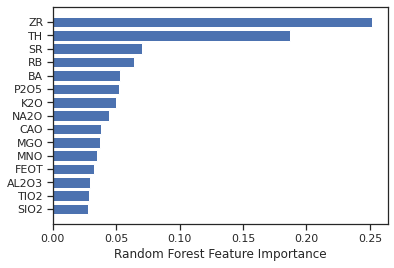

In [46]:
# Evaluating the Algorithm - location

from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(X_test[['LONGITUDE','LATITUDE']], y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(X_test[['LONGITUDE','LATITUDE']], y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(X_test[['LONGITUDE','LATITUDE']], y_pred)))

sorted_idx = regressor.feature_importances_.argsort()
plt.barh(cluster_variables, regressor.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

print(' ')
print("Accuracy:", regressor.score(X_test[cluster_variables], X_test[['LONGITUDE','LATITUDE']]))

In [47]:
# RandomForestRegression - on coordinates ( lat/long)

# Fitting Random Forest Regression to the Training set
regressor = RandomForestRegressor(n_estimators = 1000, random_state = 42)
regressor.fit(data_all[cluster_variables], data_all[['LONGITUDE','LATITUDE']]) #.values.reshape(-1,1))

# Predicting the Test set results
y_pred = regressor.predict(X[cluster_variables])



Mean Absolute Error: 0.6328978302781552
Mean Squared Error: 1.5379411053922398
Root Mean Squared Error: 1.2401375348695158
 


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:434: FutureWarning:

The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').



Accuracy: 0.962981651270564


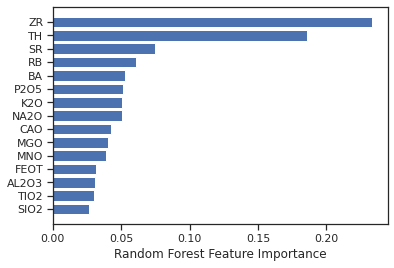

In [48]:
# Evaluating the Algorithm- all 
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(data_all[['LONGITUDE','LATITUDE']], y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(data_all[['LONGITUDE','LATITUDE']], y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(data_all[['LONGITUDE','LATITUDE']], y_pred)))

sorted_idx = regressor.feature_importances_.argsort()
plt.barh(cluster_variables, regressor.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

print(' ')
print("Accuracy:", regressor.score(data_all[cluster_variables], data_all[['LONGITUDE','LATITUDE']]))

____________________________


## LogisticRegression

- X_train
- Latitude
- Longitude
- SMOTE X_train_res

Feature Importance for LogisticRegression: Different each time
(Appeared a couple times in top 4...)
1. Variable: TIO2                Importance: 1.4
2. Variable: TH                  Importance: 1.3


The most important features keep changing for each sample of training data. The only element that reappears is TiO2. However, this element does not match the top five elements for RandomForestRegression or RandomForestClassifier. The accuracy is decent (~75). 


Mean Absolute Error: 0.27793696275071633
Mean Squared Error: 0.27793696275071633
Root Mean Squared Error: 0.5271972711905064
 
 
Accuracy: 0.7220630372492837
Precision: 0.2
Recall: 0.010638297872340425
 
[[251   4]
 [ 93   1]]


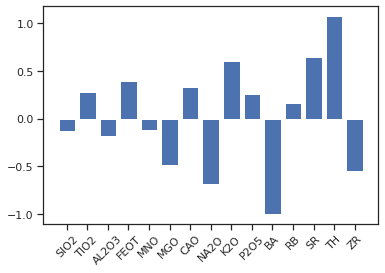

In [49]:
# Instantiate  LogisticRegression - X_train
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_train[cluster_variables],y_train)

# coef out
lrcoef = logreg.coef_
lrintercept = logreg.intercept_

y_pred=logreg.predict(X_test[cluster_variables])

# Evaluating the Algorithm

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(' ')

# get importance
importance = logreg.coef_[0] #abs(logreg.coef_[0]) # absolute value

# Create Coef plot
fig,ax = plt.subplots()
ax.bar([x for x in range(len(importance))], importance)
ax.set_xticks(np.arange(15))
ax.set_xticklabels(cluster_variables,rotation=45)

print(' ')
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

print(' ')
# Confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

Feature Importance for LogisticRegression: 
1. Variable: TH                  Importance: 1.4
2. Variable: CAO                 Importance: 1.3
3. Variable: TIO2                Importance: 0.9
4. Variable: SR                  Importance: 0.85

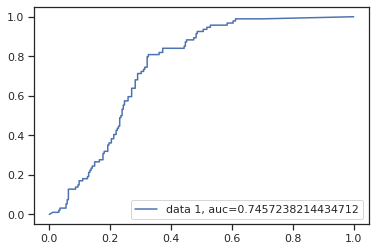

In [50]:
# Receiver Operating Characteristic(ROC) curve: LogisticRegression - X_train
# Plotting of the true positive rate against the false positive rate

y_pred_proba = logreg.predict_proba(X_test[cluster_variables])[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

# AUC score 1 represents perfect classifier, 
#     and 0.5 represents a worthless classifier.
# AUC score for the case is 0.88. ( Pretty good )

Here we see a Reciever operating curve which shows true positives rate against false positive rate. We see that we get a AUC score of 0.91 which is pretty good suggesting that we have a decent classifier. 

Mean Absolute Error: 0.2693409742120344
Mean Squared Error: 0.2693409742120344
Root Mean Squared Error: 0.5189807069747723
 
 
Accuracy: 0.7306590257879656
Precision: 0.0
Recall: 0.0
 
[[255   0]
 [ 94   0]]


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



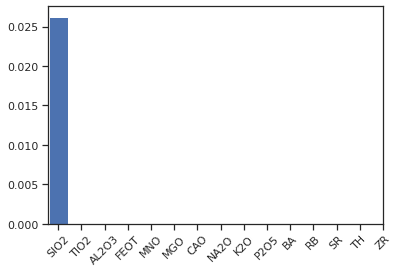

In [51]:
# Instantiate  LogisticRegression - Lat
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_train['LATITUDE'].values.reshape(-1,1),y_train)

# coef out
lrcoef = logreg.coef_
lrintercept = logreg.intercept_

y_pred=logreg.predict(X_test['LATITUDE'].values.reshape(-1,1))

# Evaluating the Algorithm

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(' ')

# get importance
importance = logreg.coef_[0] #abs(logreg.coef_[0]) # absolute value

# Create Coef plot
fig,ax = plt.subplots()
ax.bar([x for x in range(len(importance))], importance)
ax.set_xticks(np.arange(15))
ax.set_xticklabels(cluster_variables,rotation=45)

print(' ')
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

print(' ')
# Confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

In [52]:
# Receiver Operating Characteristic(ROC) curve: LogisticRegression - Lat
# Plotting of the true positive rate against the false positive rate

#y_pred_proba = logreg.predict_proba(X_train['LATITUDE'].values.reshape(-1,1))[::,1]
#fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
#auc = metrics.roc_auc_score(y_test, y_pred_proba)
#plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
#plt.legend(loc=4)
#plt.show()

# AUC score 1 represents perfect classifier, 
#     and 0.5 represents a worthless classifier.
# AUC score for the case is 0.88. ( Pretty good )

Mean Absolute Error: 0.12034383954154727
Mean Squared Error: 0.12034383954154727
Root Mean Squared Error: 0.3469060961435346
 
 
Accuracy: 0.8796561604584527
Precision: 0.7888888888888889
Recall: 0.7553191489361702
 
[[236  19]
 [ 23  71]]


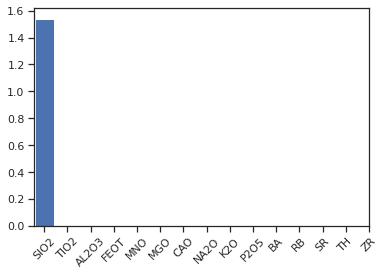

In [53]:
# Instantiate  LogisticRegression - Longitude
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_train['LONGITUDE'].values.reshape(-1,1),y_train)

# coef out
lrcoef = logreg.coef_
lrintercept = logreg.intercept_

y_pred=logreg.predict(X_test['LONGITUDE'].values.reshape(-1,1))

# Evaluating the Algorithm

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(' ')

# get importance
importance = logreg.coef_[0] #abs(logreg.coef_[0]) # absolute value

# Create Coef plot
fig,ax = plt.subplots()
ax.bar([x for x in range(len(importance))], importance)
ax.set_xticks(np.arange(15))
ax.set_xticklabels(cluster_variables,rotation=45)

print(' ')
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

print(' ')
# Confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)

In [54]:
# Receiver Operating Characteristic(ROC) curve: LogisticRegression - Long
# Plotting of the true positive rate against the false positive rate

#y_pred_proba = logreg.predict_proba(X_train['LONGITUDE'].values.reshape(-1,1))[::,1]
#fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
#auc = metrics.roc_auc_score(y_test, y_pred_proba)
#plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
#plt.legend(loc=4)
#plt.show()

# AUC score 1 represents perfect classifier, 
#     and 0.5 represents a worthless classifier.
# AUC score for the case is 0.88. ( Pretty good )

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Mean Absolute Error: 0.16905444126074498
Mean Squared Error: 0.16905444126074498
Root Mean Squared Error: 0.4111623052527371
 
 
Accuracy: 0.830945558739255
Precision: 0.64
Recall: 0.851063829787234
 
[[210  45]
 [ 14  80]]
              precision    recall  f1-score   support

         0.0       0.94      0.82      0.88       255
         1.0       0.64      0.85      0.73        94

    accuracy                           0.83       349
   macro avg       0.79      0.84      0.80       349
weighted avg       0.86      0.83      0.84       349



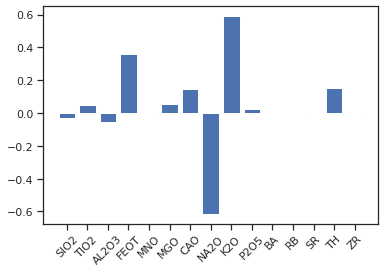

In [55]:
# Instantiate  LogisticRegression - SMOTE X_train_res
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_train_SMOTE[cluster_variables],y_train_SMOTE)

# coef out
lrcoef = logreg.coef_
lrintercept = logreg.intercept_

y_pred=logreg.predict(X_test[cluster_variables])

# Evaluating the Algorithm

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print(' ')

# get importance
importance = logreg.coef_[0] #abs(logreg.coef_[0]) # absolute value

# Create Coef plot
fig,ax = plt.subplots()
ax.bar([x for x in range(len(importance))], importance)
ax.set_xticks(np.arange(15))
ax.set_xticklabels(cluster_variables,rotation=45)

print(' ')
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))

print(' ')
# Confusion matrix
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
print(cnf_matrix)


  
# print classification report
print(classification_report(y_test, y_pred))

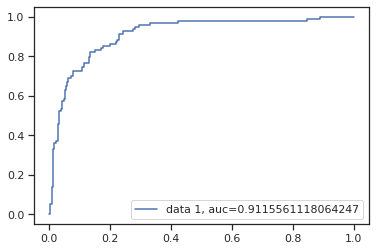

In [56]:
# Receiver Operating Characteristic(ROC) curve: LogisticRegression - SMOTE X_train_res
# Plotting of the true positive rate against the false positive rate

y_pred_proba = logreg.predict_proba(X_test[cluster_variables])[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

# AUC score 1 represents perfect classifier, 
#     and 0.5 represents a worthless classifier.
# AUC score for the case is 0.88. ( good )

_______

## Outliers

In [57]:
## Analyzing Outliers 

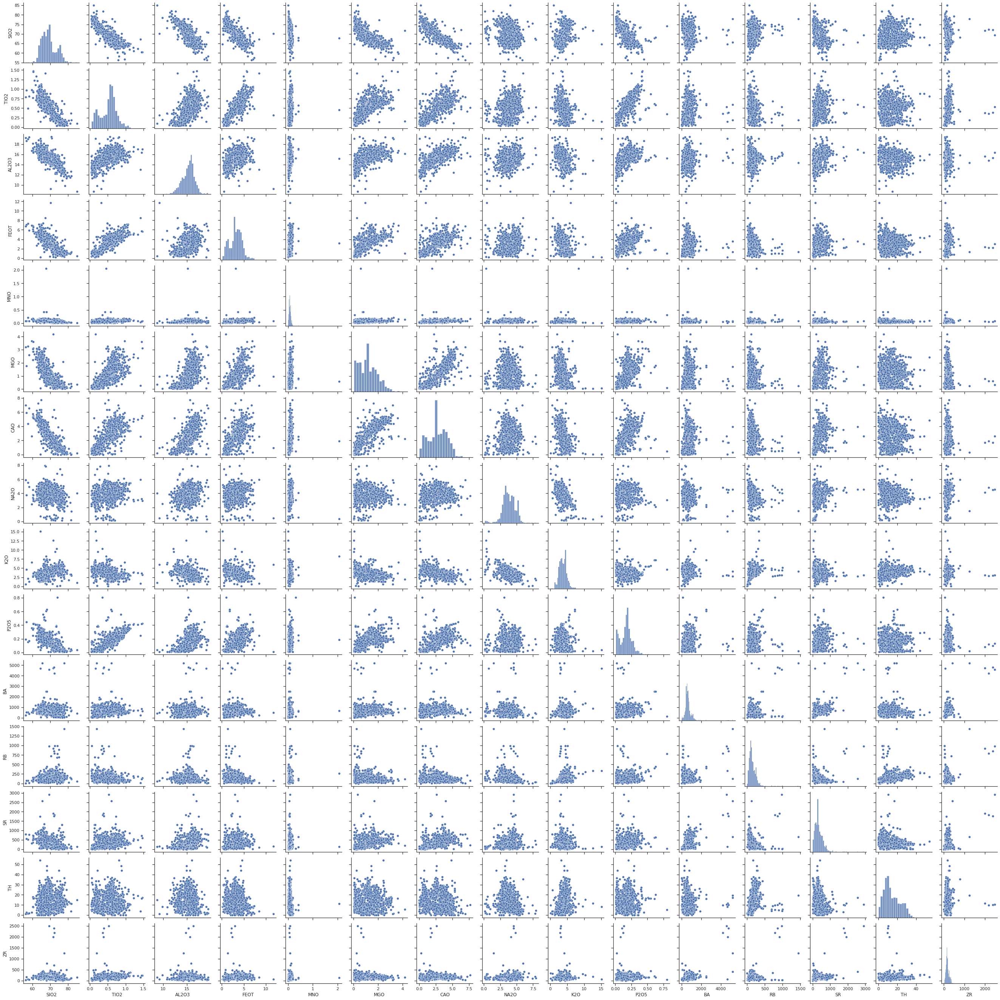

In [58]:
# Scatter plot
sns.set_theme(style="ticks")
sns.pairplot(X[cluster_variables])

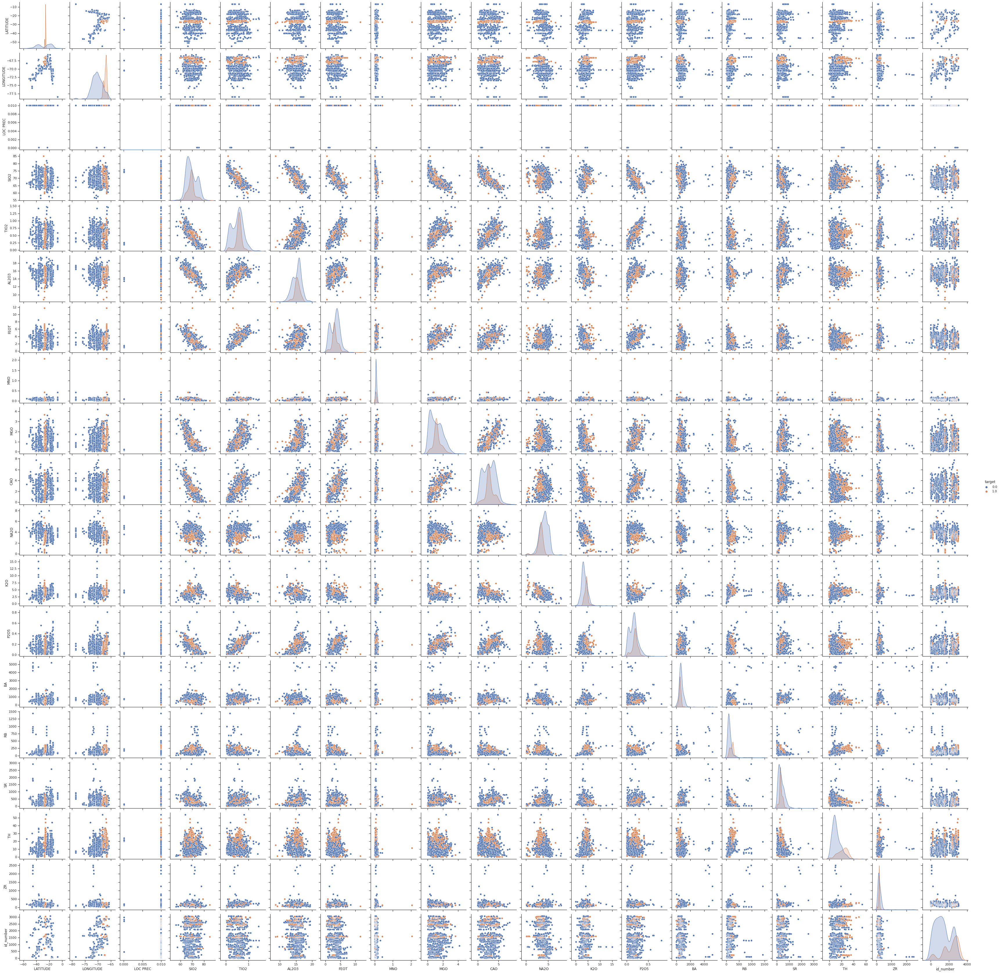

In [59]:
# Since Zr comes up for significance i will look at the outliers for them 

sns.pairplot(data_all, hue="target")

In [60]:
X.describe()

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR
count,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.000000,1161.00000
mean,69.242050,0.525711,15.271003,3.200268,0.075160,1.169162,2.766054,3.839412,3.741939,0.169208,677.654514,151.710214,348.396083,14.213792,187.22687
std,4.063344,0.232607,1.306851,1.419797,0.069718,0.737249,1.376653,0.986781,1.214934,0.093481,420.401972,113.147243,250.856147,8.637463,149.64016
min,56.343000,0.040000,8.742000,0.200000,0.004000,0.020000,0.010000,0.160000,0.061000,0.010000,9.500000,0.300000,0.000000,0.000000,0.00000
25%,66.240000,0.367000,14.482000,2.235000,0.050000,0.545000,1.771000,3.243000,2.941000,0.104000,498.000000,84.000000,180.000000,7.900000,130.00000
50%,68.834000,0.562000,15.459000,3.199000,0.063000,1.121000,2.672000,3.790000,3.680000,0.174000,617.000000,123.000000,294.900000,12.000000,170.00000
75%,71.539000,0.660000,16.108000,4.153000,0.092000,1.675000,3.845000,4.502000,4.483000,0.218000,760.000000,199.000000,461.000000,20.100000,212.00000
max,84.999000,1.472000,19.419000,11.734000,2.062000,4.184000,7.721000,7.937000,15.071000,0.807000,5202.000000,1438.000000,2914.000000,54.000000,2488.00000


### ZR Outliers

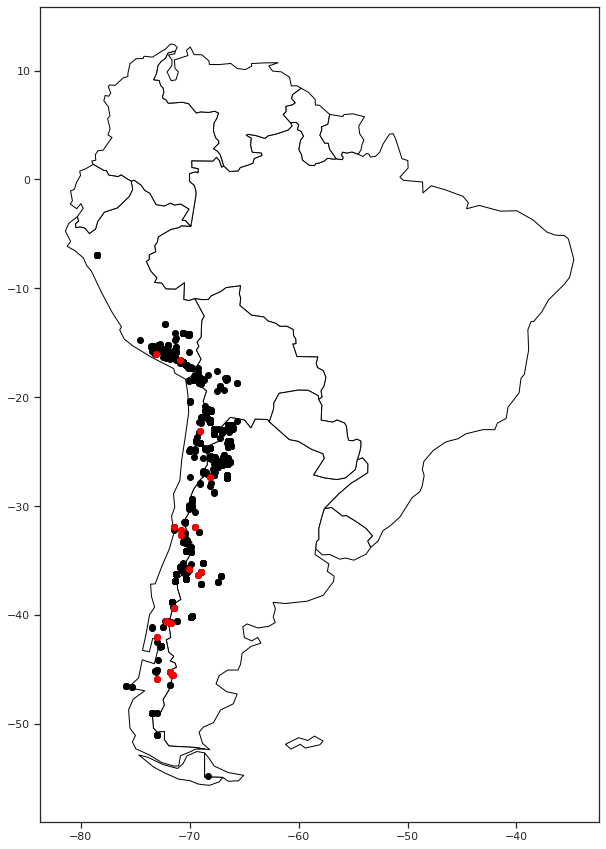

In [61]:
# ZR Outliers
# If sample element (ZR) is greater than its 99% (361),

Outlier_ZR = data_all.loc[(data_all['ZR'] > 361)]
Outlier_ZR

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot ZR Outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_ZR, geometry=geopandas.points_from_xy(Outlier_ZR['LONGITUDE'],Outlier_ZR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### P2O5 Outliers

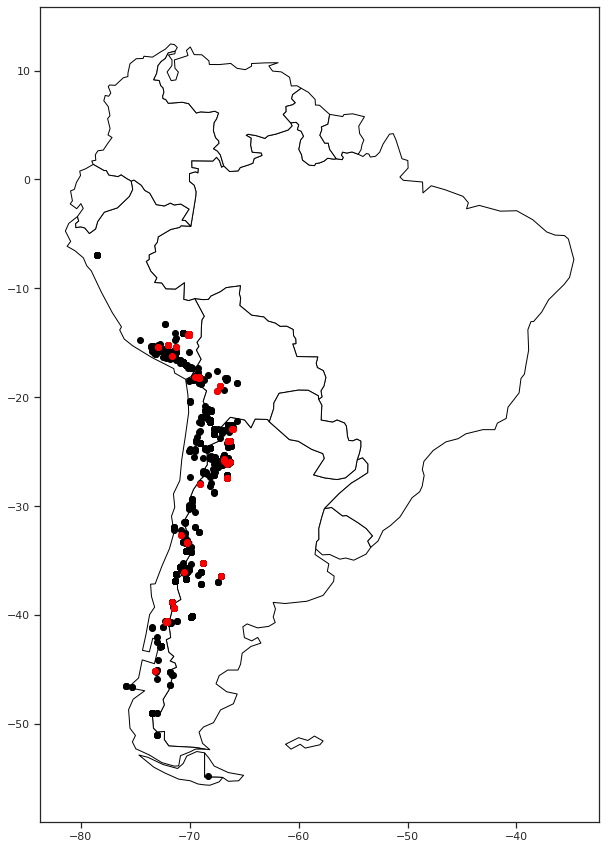

In [62]:
# P2O5 Outliers
# If sample element (P2O5) is greater than its 99% (0.3114),

Outlier_P2O5 = data_all.loc[(data_all['P2O5'] > 0.3114)]
Outlier_P2O5

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot P2O5 outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_P2O5, geometry=geopandas.points_from_xy(Outlier_P2O5['LONGITUDE'],Outlier_P2O5['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### K2O Outliers

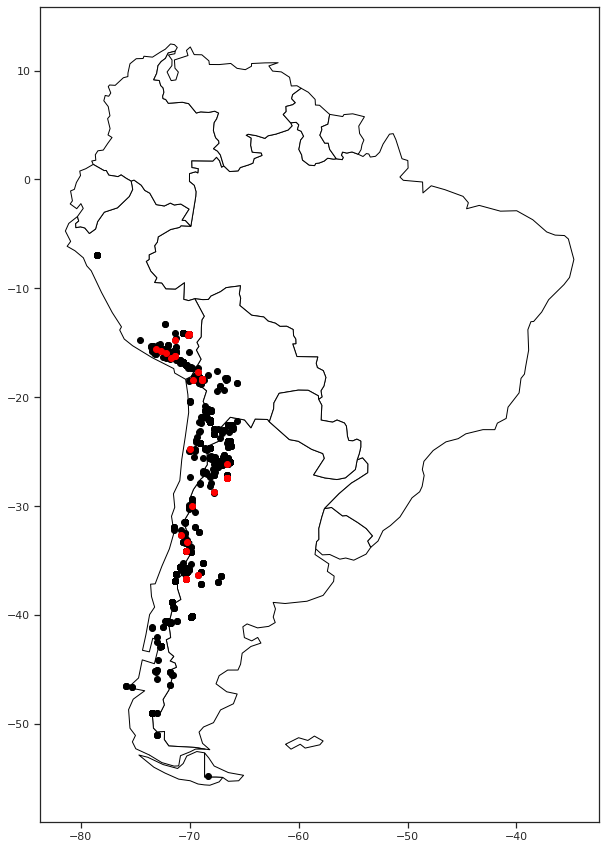

In [63]:
# K2O Outliers
# If sample element (K2O) is greater than its 99% (5.7),

Outlier_K2O = data_all.loc[(data_all['K2O'] > 5.7)]
Outlier_K2O

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot K2O outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_K2O, geometry=geopandas.points_from_xy(Outlier_K2O['LONGITUDE'],Outlier_K2O['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()

### NA2O Outliers

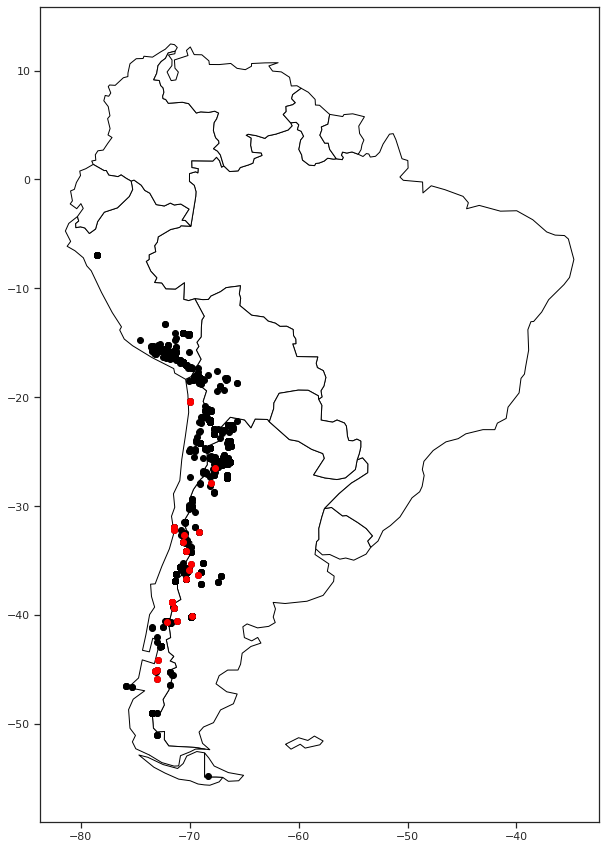

In [64]:
# NA2O  Outliers
# If sample element (NA2O ) is greater than its 99% (5.4887),

Outlier_NA2O  = data_all.loc[(data_all['NA2O'] > 5.4887)]
Outlier_NA2O 

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot NA2O outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_NA2O, geometry=geopandas.points_from_xy(Outlier_NA2O['LONGITUDE'],Outlier_NA2O['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()

### CAO Outliers

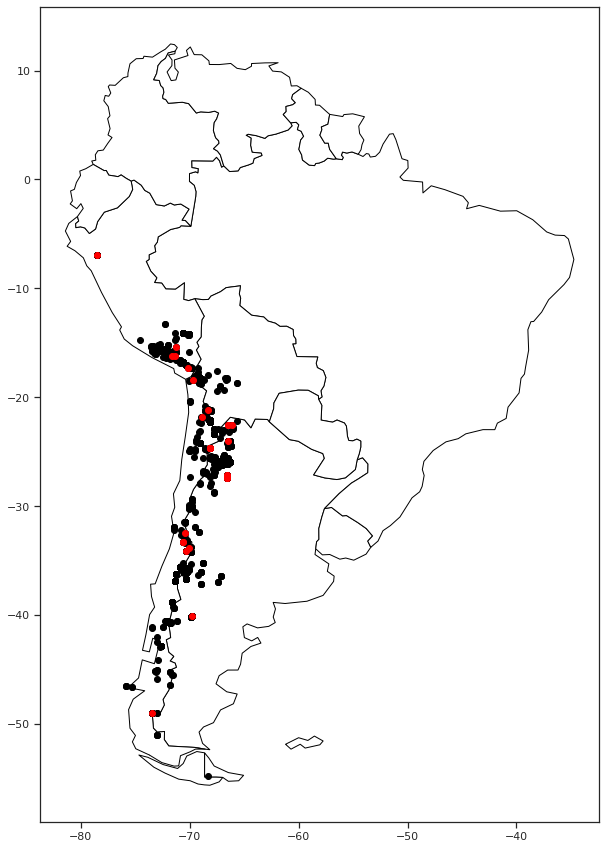

In [65]:
# CAO Outliers
# If sample element (CAO ) is greater than its 99% (5.2216),

Outlier_CAO  = data_all.loc[(data_all['CAO'] > 5.2216)]
Outlier_CAO 

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot CAO outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_CAO, geometry=geopandas.points_from_xy(Outlier_CAO['LONGITUDE'],Outlier_CAO['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()

### MNO Outliers

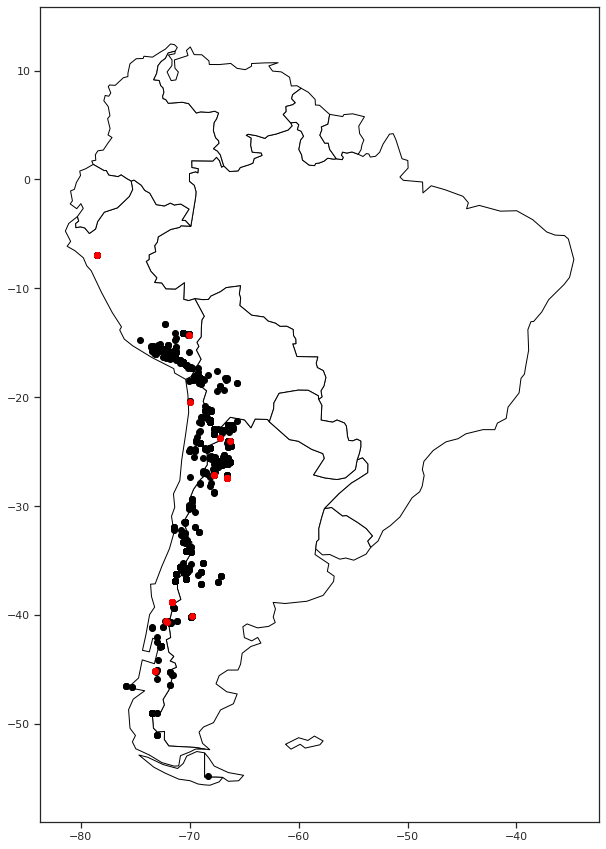

In [66]:
# MNO Outliers
# If sample element (MNO ) is greater than its 99% (0.1617),

Outlier_MNO  = data_all.loc[(data_all['MNO'] > 0.1617)]
Outlier_MNO 

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot MNO outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_MNO, geometry=geopandas.points_from_xy(Outlier_MNO['LONGITUDE'],Outlier_MNO['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()

### FEOT Outliers

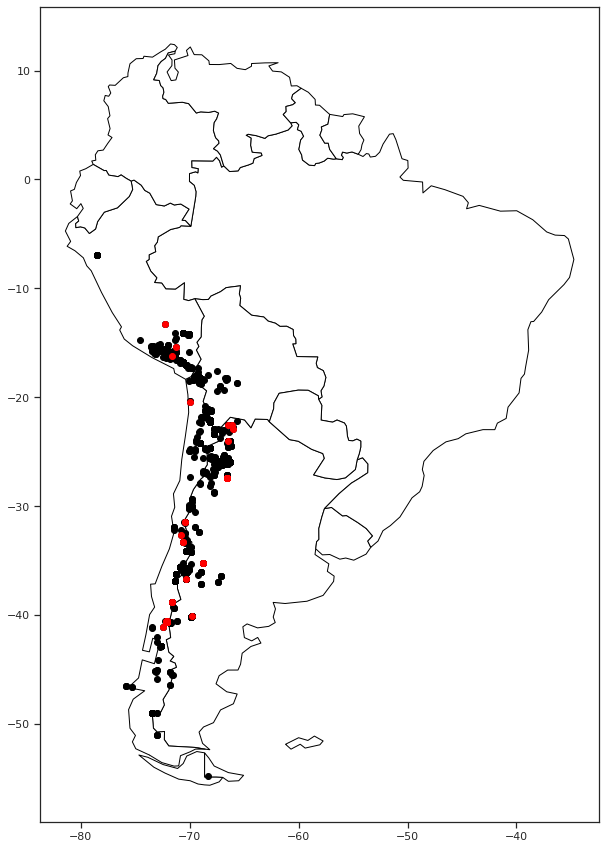

In [67]:
# FEOT Outliers
# If sample element (FEOT) is greater than its 99% (5.5727),

Outlier_FEOT = data_all.loc[(data_all['FEOT'] > 5.5727)]
Outlier_FEOT

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot FEOT outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_FEOT, geometry=geopandas.points_from_xy(Outlier_FEOT['LONGITUDE'],Outlier_FEOT['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()

### TIO2 Outliers

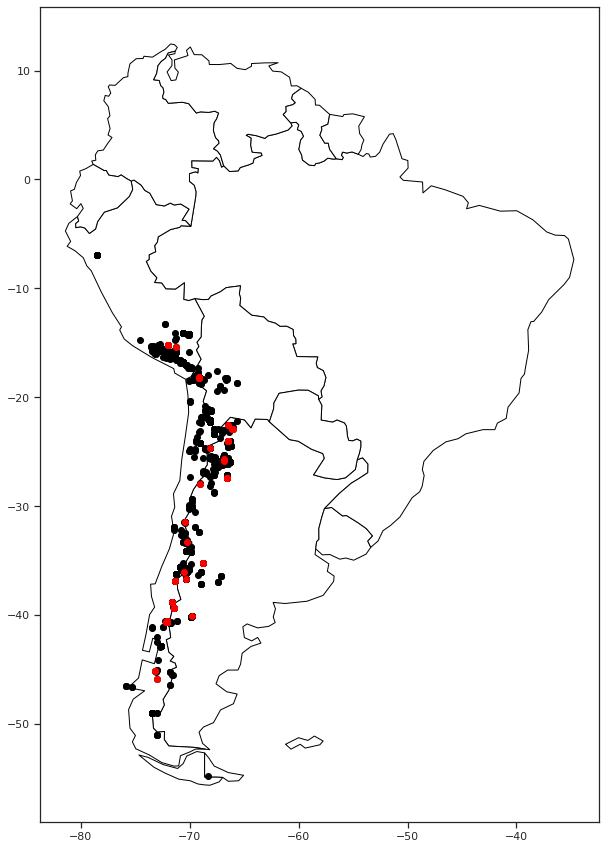

In [68]:
# TIO2 Outliers
# If sample element (TIO2) is greater than its 99%  (0.8926),

Outlier_TIO2 = data_all.loc[(data_all['TIO2'] > 0.8926)]
Outlier_TIO2

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot TIO2 outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_TIO2, geometry=geopandas.points_from_xy(Outlier_TIO2['LONGITUDE'],Outlier_TIO2['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### TH Outliers

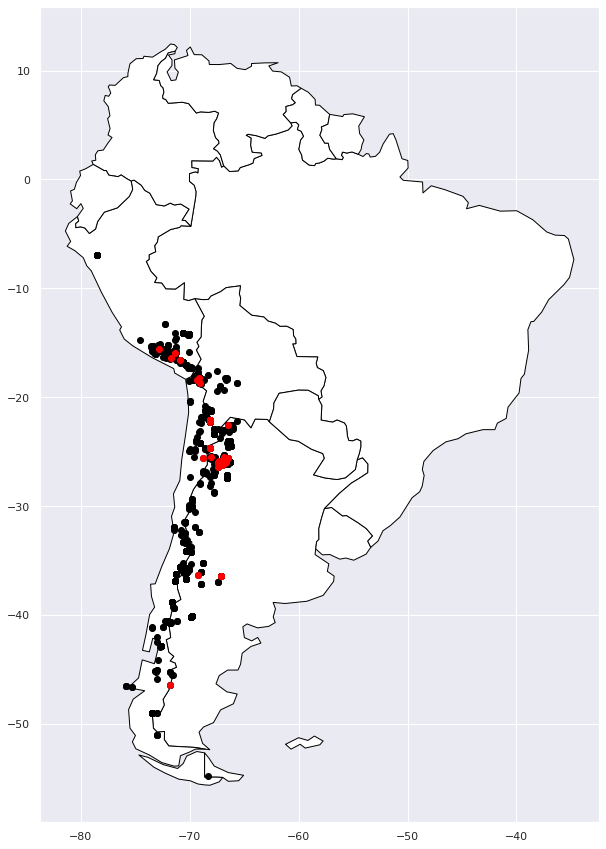

In [40]:
# TH Outliers
# If sample element (TH) is greater than its 99%  (28.737),

Outlier_TH = data_all.loc[(data_all['TH'] > 28.737)]
Outlier_TH

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot TH outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_TH, geometry=geopandas.points_from_xy(Outlier_TH['LONGITUDE'],Outlier_TH['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### BA Outliers

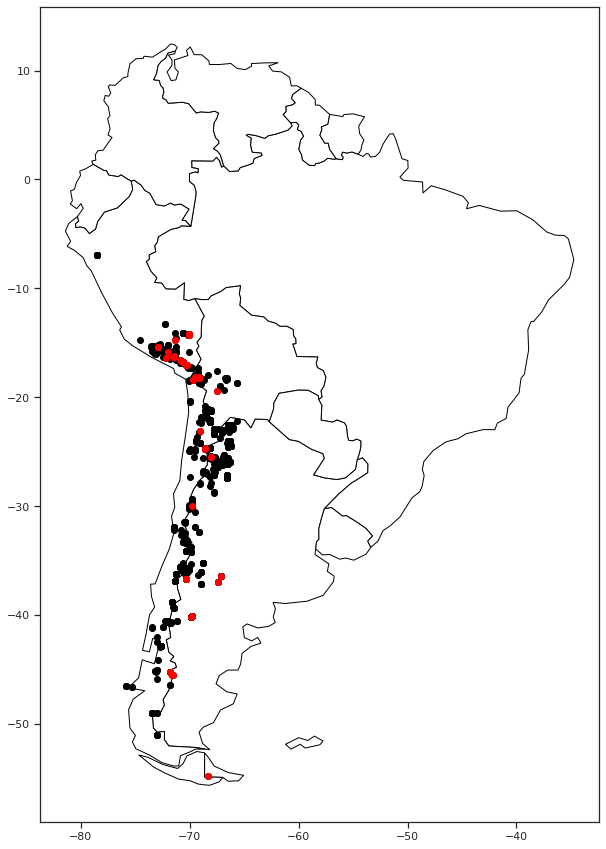

In [70]:
# BA Outliers
# If sample element (BA) is greater than its 99%(1181),

Outlier_BA = data_all.loc[(data_all['BA'] > 1181)]
Outlier_BA

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot BA outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_BA, geometry=geopandas.points_from_xy(Outlier_BA['LONGITUDE'],Outlier_BA['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### RB Outliers

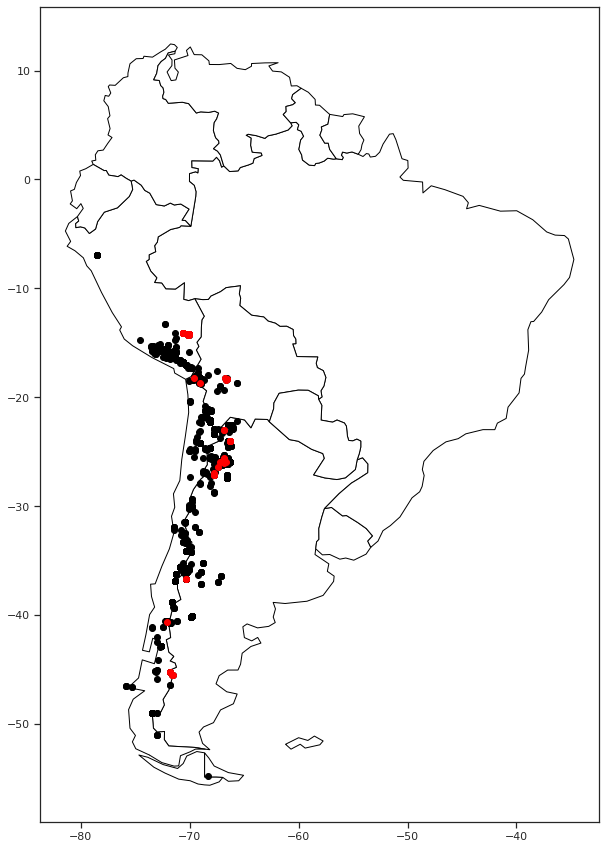

In [71]:
# RB Outliers
# If sample element (RB) is greater than its 99% (312),

Outlier_RB = data_all.loc[(data_all['RB'] > 312)]
Outlier_RB

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot RB outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_RB, geometry=geopandas.points_from_xy(Outlier_RB['LONGITUDE'],Outlier_RB['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### SR Outliers *

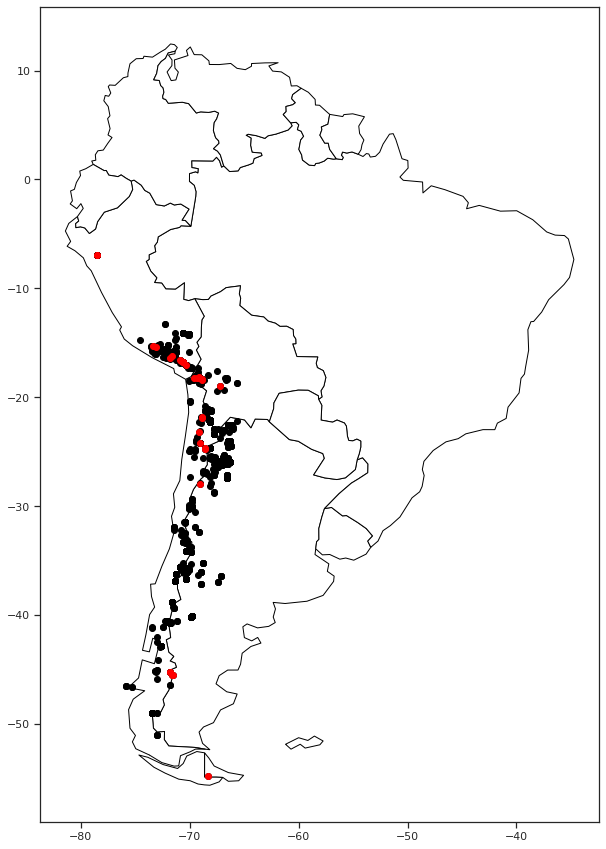

In [72]:
# SR Outliers
# If sample element (SR) is greater than its 99% (711),

Outlier_SR = data_all.loc[(data_all['SR'] > 850)]
Outlier_SR

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot SR outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_SR, geometry=geopandas.points_from_xy(Outlier_SR['LONGITUDE'],Outlier_SR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### TIO2 vs. ZR

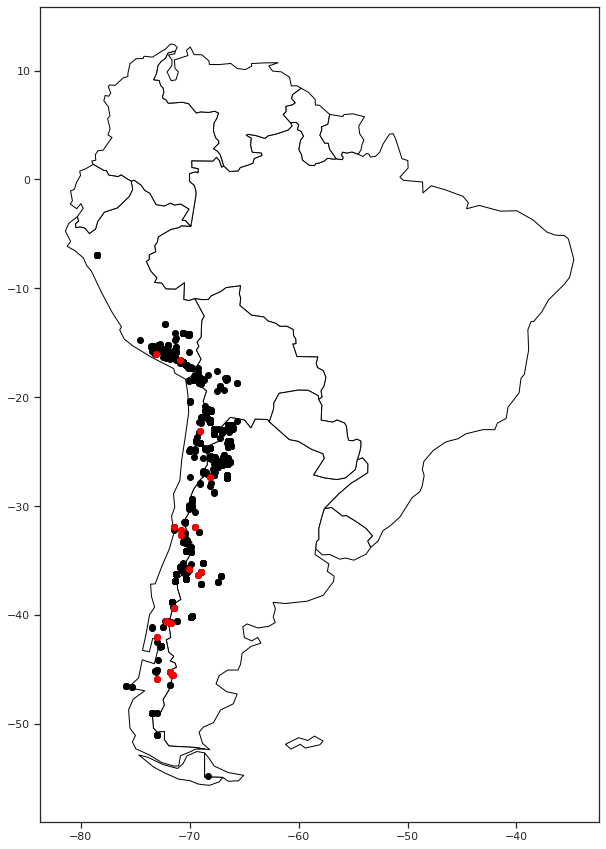

In [73]:
# TIO2 vs. ZR Outliers
# If sample element (TIO2 AND ZR) is greater than its 99%

Outlier_TIO2_ZR = data_all.loc[data_all['TIO2'] > 0.8926]
Outlier_TIO2_ZR = data_all.loc[(data_all['ZR'] > 361)]
# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot TIO2_ZR outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_TIO2_ZR, geometry=geopandas.points_from_xy(Outlier_TIO2_ZR['LONGITUDE'],Outlier_TIO2_ZR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### RB AND ZR

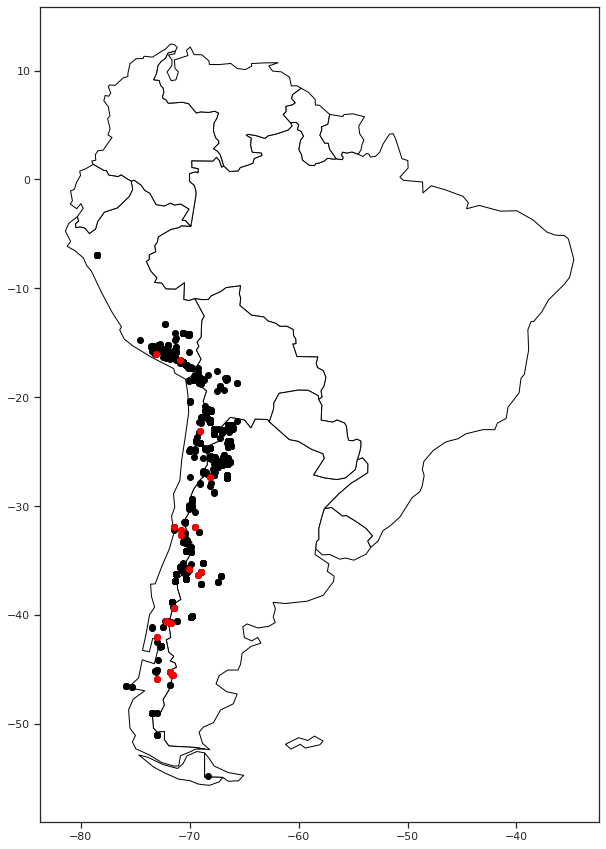

In [74]:
# RB vs. ZR Outliers
# If sample element (RB AND ZR) is greater than its 99%

Outlier_RB_ZR = data_all.loc[data_all['RB'] > 0.312]
Outlier_RB_ZR = data_all.loc[(data_all['ZR'] > 361)]

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot Outlier_RB_ZR outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_RB_ZR, geometry=geopandas.points_from_xy(Outlier_RB_ZR['LONGITUDE'],Outlier_RB_ZR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### ZR VS TH


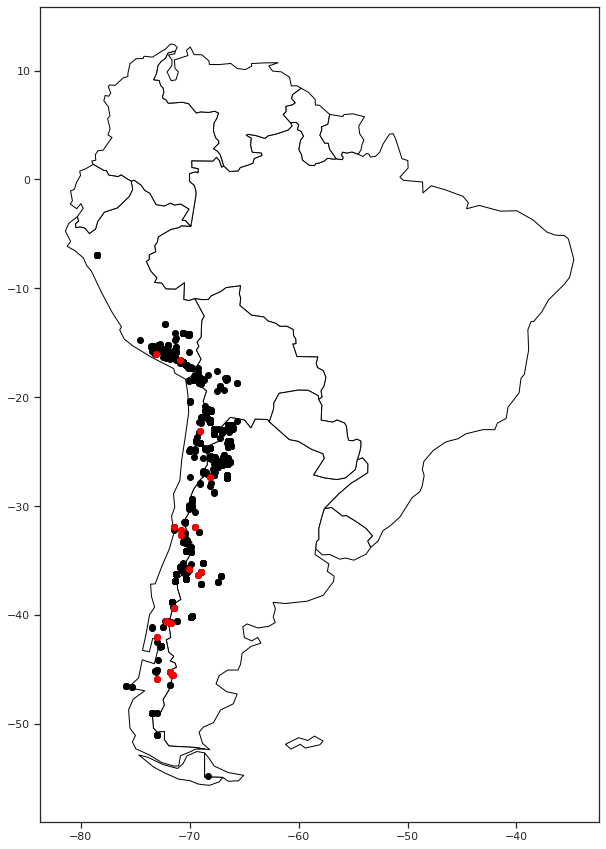

In [75]:
# Th vs. ZR Outliers
# If sample element (TH AND ZR) is greater than its 99%

Outlier_TH_ZR = data_all.loc[data_all['TH'] > 28.737]
Outlier_TH_ZR = data_all.loc[(data_all['ZR'] > 361)]

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot Outlier_TH_ZR outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_TH_ZR, geometry=geopandas.points_from_xy(Outlier_TH_ZR['LONGITUDE'],Outlier_TH_ZR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### BA VS ZR

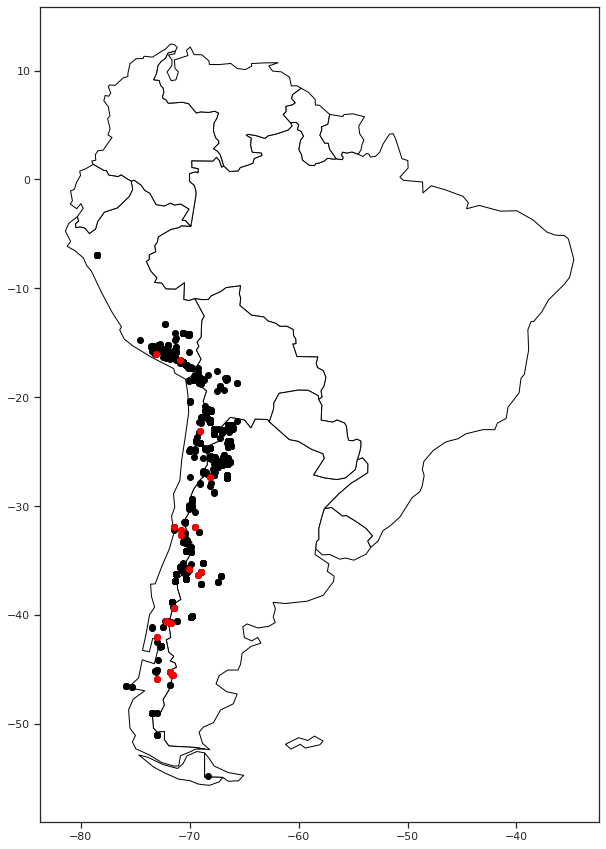

In [76]:
# BA vs. ZR Outliers
# If sample element (BA AND ZR) is greater than its 99%

Outlier_BA_ZR = data_all.loc[data_all['BA'] > 1181]
Outlier_BA_ZR = data_all.loc[(data_all['ZR'] > 361)]

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot Outlier_BA_ZR outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_BA_ZR, geometry=geopandas.points_from_xy(Outlier_BA_ZR['LONGITUDE'],Outlier_BA_ZR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


### MNO VS ZR

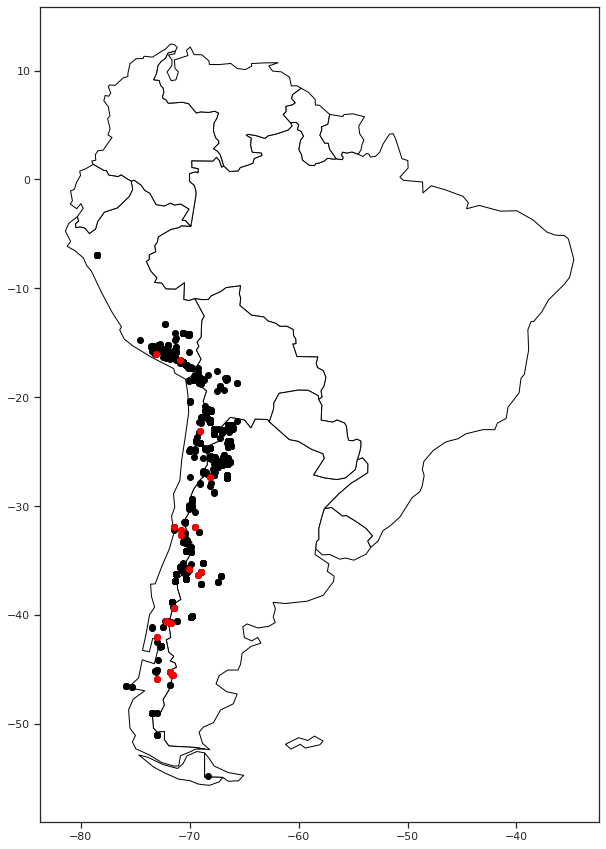

In [77]:
# MNO vs. ZR Outliers
# If sample element (MNO AND ZR) is greater than its 99%

Outlier_MNO_ZR = data_all.loc[data_all['MNO'] > 0.1617]
Outlier_MNO_ZR = data_all.loc[(data_all['ZR'] > 361)]

# Plot the location of the outliers 

gdf = geopandas.GeoDataFrame(data_all, geometry=geopandas.points_from_xy(data_all['LONGITUDE'],data_all['LATITUDE']))
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

  # We restrict to South America.
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='black')

# Plot Outlier_MNO_ZR outlier samples 
gdf = geopandas.GeoDataFrame(Outlier_MNO_ZR, geometry=geopandas.points_from_xy(Outlier_MNO_ZR['LONGITUDE'],Outlier_MNO_ZR['LATITUDE']))
  # We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax,color='red')
plt.show()


## Meshgrid plot

 - computing KDE in spherical coordinates
 - plot coastlines from coverage
 - computing KDE in spherical coordinates
 - plot coastlines from coverage


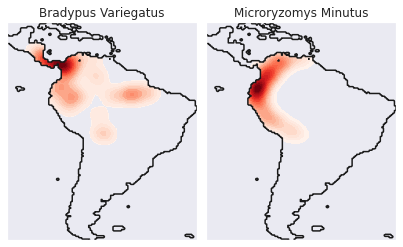

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_species_distributions
from sklearn.neighbors import KernelDensity

# if basemap is available, we'll use it.
# otherwise, we'll improvise later...
try:
    from mpl_toolkits.basemap import Basemap
    basemap = True
except ImportError:
    basemap = False


def construct_grids(batch):
    """Construct the map grid from the batch object

    Parameters
    ----------
    batch : Batch object
        The object returned by :func:`fetch_species_distributions`

    Returns
    -------
    (xgrid, ygrid) : 1-D arrays
        The grid corresponding to the values in batch.coverages
    """
    # x,y coordinates for corner cells
    xmin = batch.x_left_lower_corner + batch.grid_size
    xmax = xmin + (batch.Nx * batch.grid_size)
    ymin = batch.y_left_lower_corner + batch.grid_size
    ymax = ymin + (batch.Ny * batch.grid_size)

    # x coordinates of the grid cells
    xgrid = np.arange(xmin, xmax, batch.grid_size)
    # y coordinates of the grid cells
    ygrid = np.arange(ymin, ymax, batch.grid_size)

    return (xgrid, ygrid)


# Get matrices/arrays of species IDs and locations
data = fetch_species_distributions()
species_names = ['Bradypus Variegatus', 'Microryzomys Minutus']

Xtrain = np.vstack([data['train']['dd lat'],
                    data['train']['dd long']]).T
ytrain = np.array([d.decode('ascii').startswith('micro')
                  for d in data['train']['species']], dtype='int')
Xtrain *= np.pi / 180.  # Convert lat/long to radians

# Set up the data grid for the contour plot
xgrid, ygrid = construct_grids(data)
X, Y = np.meshgrid(xgrid[::5], ygrid[::5][::-1])
land_reference = data.coverages[6][::5, ::5]
land_mask = (land_reference > -9999).ravel()

xy = np.vstack([Y.ravel(), X.ravel()]).T
xy = xy[land_mask]
xy *= np.pi / 180.

# Plot map of South America with distributions of each species
fig = plt.figure()
fig.subplots_adjust(left=0.05, right=0.95, wspace=0.05)

for i in range(2):
    plt.subplot(1, 2, i + 1)

    # construct a kernel density estimate of the distribution
    print(" - computing KDE in spherical coordinates")
    kde = KernelDensity(bandwidth=0.04, metric='haversine',
                        kernel='gaussian', algorithm='ball_tree')
    kde.fit(Xtrain[ytrain == i])

    # evaluate only on the land: -9999 indicates ocean
    Z = np.full(land_mask.shape[0], -9999, dtype='int')
    Z[land_mask] = np.exp(kde.score_samples(xy))
    Z = Z.reshape(X.shape)

    # plot contours of the density
    levels = np.linspace(0, Z.max(), 25)
    plt.contourf(X, Y, Z, levels=levels, cmap=plt.cm.Reds)

    if basemap:
        print(" - plot coastlines using basemap")
        m = Basemap(projection='cyl', llcrnrlat=Y.min(),
                    urcrnrlat=Y.max(), llcrnrlon=X.min(),
                    urcrnrlon=X.max(), resolution='c')
        m.drawcoastlines()
        m.drawcountries()
    else:
        print(" - plot coastlines from coverage")
        plt.contour(X, Y, land_reference,
                    levels=[-9998], colors="k",
                    linestyles="solid")
        plt.xticks([])
        plt.yticks([])

    plt.title(species_names[i])

plt.show()

In [25]:
X_train

,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,id_number,LATITUDE,LONGITUDE
2363,-1.010020,0.747853,0.985819,0.790012,1.148610,1.870884,0.556077,-0.965214,0.164583,1.333135,-0.452916,0.182441,0.342103,1.189782,0.274342,2363,-25.8166,-66.3639
2457,-1.207720,0.909033,0.786264,0.794926,-0.057708,1.470698,1.379550,-0.445644,0.002771,0.197219,0.033261,-0.124237,0.166603,0.221972,0.023670,2457,-25.4809,-68.0527
210,-0.031327,0.120558,-0.130936,-0.215410,-0.620656,0.013965,-0.126168,-0.235223,0.808533,0.275946,-0.414492,1.068091,-0.254190,1.411329,-0.115163,210,-25.9800,-67.2100
2366,-0.736280,0.320944,0.772710,0.481785,0.746504,-0.053887,0.692236,-0.611188,0.649197,1.096954,-0.097432,0.312547,0.493115,0.641745,0.107227,2366,-25.8166,-66.3639
2973,0.123449,0.063927,-0.352329,-0.304578,-0.593849,-0.102352,-0.076919,-0.574290,0.933195,0.365919,-0.491862,1.327373,-0.257863,1.562914,-0.072099,2973,-25.8909,-66.8086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2552,0.512963,-0.724548,0.310344,-0.937180,-1.129990,0.058276,-0.797548,-0.885434,0.744138,0.961994,-0.361431,1.929578,-0.702736,0.536802,-0.342696,2552,-14.0678,-70.5843
1460,-0.032799,-0.188734,0.487308,-0.232963,0.263977,-0.296214,0.440921,-0.152451,-0.339844,0.242206,0.229299,-0.254343,0.072731,-0.594254,0.152220,1460,-22.5000,-66.5000
1421,0.186978,-0.001416,-0.835779,0.049285,-0.352585,0.740947,0.338077,-0.734848,0.058910,-0.511323,-0.186303,0.126682,-0.253782,1.737819,-0.265566,1421,-22.1200,-68.1500
1432,-0.310218,-0.001416,0.198895,0.050689,-0.352585,0.797721,0.681372,-0.582268,0.035794,-0.387609,-0.128798,0.163855,-0.106851,1.621216,-0.297703,1432,-22.1200,-68.1500


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_species_distributions
from sklearn.neighbors import KernelDensity

# if basemap is available, we'll use it.
# otherwise, we'll improvise later...
try:
    from mpl_toolkits.basemap import Basemap
    basemap = True
except ImportError:
    basemap = False


def construct_grids(batch):
    """Construct the map grid from the batch object

    Parameters
    ----------
    batch : Batch object
        The object returned by :func:`fetch_species_distributions`

    Returns
    -------
    (xgrid, ygrid) : 1-D arrays
        The grid corresponding to the values in batch.coverages
    """
    # x,y coordinates for corner cells
    xmin = batch.x_left_lower_corner + batch.grid_size
    xmax = xmin + (batch.Nx * batch.grid_size)
    ymin = batch.y_left_lower_corner + batch.grid_size
    ymax = ymin + (batch.Ny * batch.grid_size)

    # x coordinates of the grid cells
    xgrid = np.arange(xmin, xmax, batch.grid_size)
    # y coordinates of the grid cells
    ygrid = np.arange(ymin, ymax, batch.grid_size)

    return (xgrid, ygrid)


# Get matrices/arrays of species IDs and locations
#data = data_all
#species_names = ['Bradypus Variegatus', 'Microryzomys Minutus']

Xtrain = np.vstack([X_train['LATITUDE'],
                    X_train['LONGITUDE']]).T

ytrain = np.array([X_train['TH']])


Xtrain *= np.pi / 180.  # Convert lat/long to radians

# Set up the data grid for the contour plot
xgrid, ygrid = construct_grids(data)
X, Y = np.meshgrid(xgrid[::5], ygrid[::5][::-1])
land_reference = data.coverages[6][::5, ::5]
land_mask = (land_reference > -9999).ravel()

xy = np.vstack([Y.ravel(), X.ravel()]).T
xy = xy[land_mask]
xy *= np.pi / 180.

# Plot map of South America with distributions of each species
fig = plt.figure()
fig.subplots_adjust(left=0.05, right=0.95, wspace=0.05)

for i in range(2):
    plt.subplot(1, 2, i + 1)

    # construct a kernel density estimate of the distribution
    print(" - computing KDE in spherical coordinates")
    kde = KernelDensity(bandwidth=0.04, metric='haversine',
                        kernel='gaussian', algorithm='ball_tree')
    kde.fit(Xtrain)

    # evaluate only on the land: -9999 indicates ocean
    Z = np.full(land_mask.shape[0], -9999, dtype='int')
    Z[land_mask] = np.exp(kde.score_samples(xy))
    Z = Z.reshape(X.shape)

    # plot contours of the density
    levels = np.linspace(0, Z.max(), 25)
    plt.contourf(X, Y, Z, levels=levels, cmap=plt.cm.Reds)

    if basemap:
        print(" - plot coastlines using basemap")
        m = Basemap(projection='cyl', llcrnrlat=Y.min(),
                    urcrnrlat=Y.max(), llcrnrlon=X.min(),
                    urcrnrlon=X.max(), resolution='c')
        m.drawcoastlines()
        m.drawcountries()
    else:
        print(" - plot coastlines from coverage")
        plt.contour(X, Y, land_reference,
                    levels=[-9998], colors="k",
                    linestyles="solid")
        plt.xticks([])
        plt.yticks([])

    plt.title(species_names[i])

plt.show()

NameError: ignored

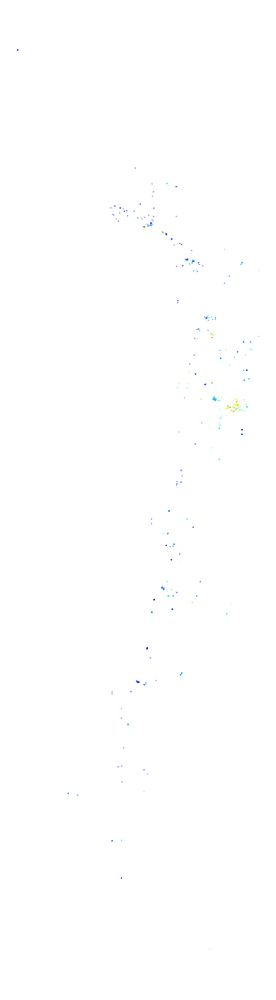

In [24]:
import shapely

gdf = geopandas.GeoDataFrame(X_train, 
            geometry=geopandas.points_from_xy(X_train.LONGITUDE, X_train.LATITUDE),
            crs="+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs")

gdf = gdf.drop(columns=['LATITUDE', 'LONGITUDE'])

ax = gdf.plot(markersize=.1, figsize=(30, 23), column='TH', cmap='jet')
plt.autoscale(False)
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.to_crs(gdf.crs).plot(ax=ax, color='none', edgecolor='black')
ax.axis('off')


# total area for the grid
xmin, ymin, xmax, ymax= gdf.total_bounds
# how many cells across and down
n_cells=100
cell_size = (xmax-xmin)/n_cells
# projection of the grid
crs = "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"
# create the cells in a loop
grid_cells = []
for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in np.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append(shapely.geometry.box(x0, y0, x1, y1)  )
cell = geopandas.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs=crs)



(-79.1589, -65.0591, -57.19125, -4.58375)

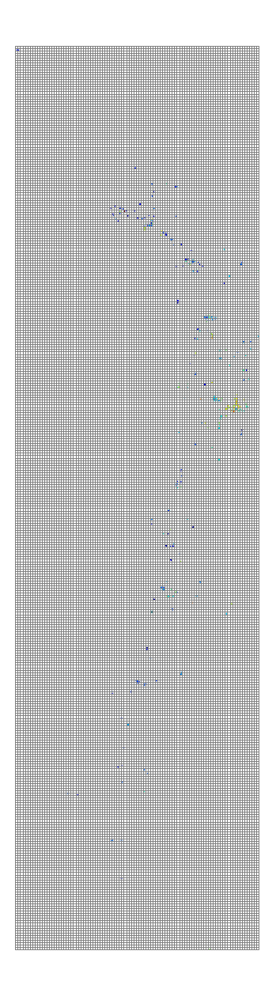

In [25]:
ax = gdf.plot(markersize=1, figsize=(30, 23), column='TH', cmap='jet')
plt.autoscale(False)
cell.plot(ax=ax, facecolor="none", edgecolor='grey')
ax.axis("off")

In [26]:
# make a simple count variable that we can sum
#merged['TH_test']=1
# Compute stats per grid cell -- aggregate fires to grid cells with dissolve
dissolve = gdf.dissolve(aggfunc="count")
# put this into cell
cell.loc[dissolve.index, 'TH'] = dissolve.TH.values

In [27]:

dissolve['n_fires']=1
# Compute stats per grid cell -- aggregate fires to grid cells with dissolve
dissolve = dissolve.n_fires(by="index_right", aggfunc="count")
# put this into cell
cell.loc[dissolve.index, 'n_fires'] = dissolve.n_fires.values

TypeError: ignored

In [ ]:
ax = cell.plot(column='TH', figsize=(12, 8), cmap='viridis', vmax=5000, edgecolor="grey")
plt.autoscale(False)
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.to_crs(cell.crs).plot(ax=ax, color='none', edgecolor='black')
ax.axis('off')

In [50]:
data_all

,SAMPLE ID,SOURCE,REFERENCE,LATITUDE,LONGITUDE,LOC PREC,MATERIAL,TYPE,COMPOSITION,ROCK NAME,SIO2,TIO2,AL2O3,FEOT,MNO,MGO,CAO,NA2O,K2O,P2O5,BA,RB,SR,TH,ZR,geometry,target,id_number
0,080385-4,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",-41.1000,-72.4930,0.01,igneous,volcanic,felsic,dacite,69.144,0.565,14.590,4.261,0.081,1.111,3.544,4.402,2.141,0.162,550.0,69.1,190.0,8.60,282.0,POINT (-72.49300 -41.10000),0.0,0
1,230483-3,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",-41.1000,-72.4930,0.01,igneous,volcanic,felsic,dacite,63.541,0.796,16.427,5.973,0.121,1.732,5.136,4.562,1.460,0.252,396.0,45.6,294.0,4.30,195.0,POINT (-72.49300 -41.10000),0.0,1
2,PU-02-34,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5088,-72.2060,0.01,igneous,volcanic,felsic,dacite,70.931,0.340,13.794,4.671,0.140,0.310,1.771,5.182,2.791,0.070,747.0,62.0,138.0,8.30,307.0,POINT (-72.20600 -40.50880),0.0,2
3,PU-02-25,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5275,-72.1812,0.01,igneous,volcanic,felsic,dacite,70.047,0.688,14.039,4.367,0.110,0.638,2.154,5.195,2.612,0.150,776.0,73.0,161.0,9.18,342.0,POINT (-72.18120 -40.52750),0.0,3
4,PU-02-20,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",-40.5675,-72.1743,0.01,igneous,volcanic,felsic,dacite,69.367,0.531,14.150,5.167,0.150,0.471,2.213,5.167,2.664,0.120,692.0,66.0,197.0,8.82,308.0,POINT (-72.17430 -40.56750),0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3055,RIG187,GEOROC,"DAVIDSON, J. P.; MCMILLAN, N. J.; MOORBATH, S....",-18.2458,-69.2194,0.01,igneous,volcanic,felsic,rhyolite,75.549,0.205,13.303,1.201,0.051,0.185,0.893,3.880,4.681,0.051,296.0,146.0,157.0,18.40,108.0,POINT (-69.21940 -18.24580),0.0,3055
3056,AJO 017,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",-18.2167,-69.2125,0.01,igneous,volcanic,felsic,rhyolite,74.796,0.274,13.367,1.418,0.071,0.478,1.078,3.680,4.808,0.030,513.0,40.4,512.6,4.00,73.0,POINT (-69.21250 -18.21670),0.0,3056
3057,AJO017,GEOROC,"DAVIDSON, J. P.; MCMILLAN, N. J.; MOORBATH, S....",-18.2458,-69.2194,0.01,igneous,volcanic,felsic,rhyolite,75.237,0.258,13.388,1.419,0.072,0.381,1.051,3.545,4.607,0.041,638.0,146.0,147.0,16.30,121.0,POINT (-69.21940 -18.24580),0.0,3057
3061,CHO 099,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",-18.3014,-69.2431,0.01,igneous,volcanic,felsic,dacite,66.728,0.555,17.025,3.542,0.030,0.807,3.845,4.087,3.199,0.182,766.0,61.0,508.0,5.00,101.0,POINT (-69.24310 -18.30140),0.0,3061


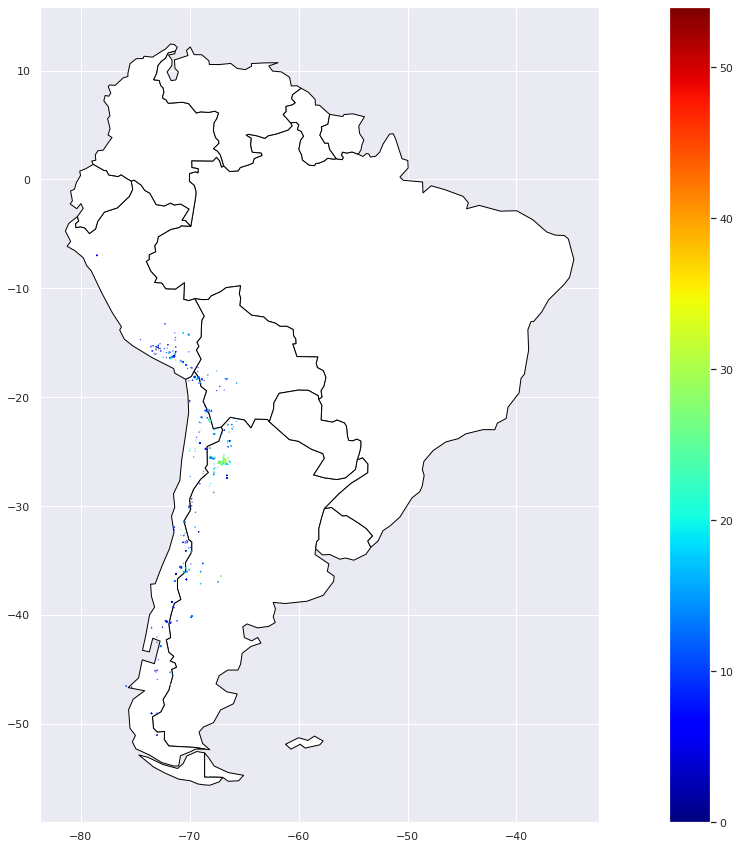

In [24]:
import shapely
import pandas as pd
import geopandas
import matplotlib.pyplot as plt

gdf = geopandas.GeoDataFrame(data_all,
                             geometry=geopandas.points_from_xy(data_all.LONGITUDE,
                                                               data_all.LATITUDE),
                                                               crs = "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs")

gdf = gdf.drop(columns=['SIO2',
 'TIO2',
 'AL2O3',
 'FEOT',
 'MNO',
 'MGO',
 'CAO',
 'NA2O',
 'K2O',
 'P2O5',
 'BA',
 'RB',
 'SR',
 'ZR',
 'LATITUDE', 'LONGITUDE'])

# We restrict to South America.
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, markersize=.1, figsize=(30, 23), column='TH', cmap='jet',legend=True)

plt.show()


In [25]:
# total area for the grid
xmin, ymin, xmax, ymax= gdf.total_bounds
# how many cells across and down
n_cells=30
cell_size = (xmax-xmin)/n_cells
# projection of the grid
crs = "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"
# create the cells in a loop
grid_cells = []
for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in np.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append( shapely.geometry.box(x0, y0, x1, y1)  )
cell = geopandas.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs=crs)

(-83.74499000724278,
 -32.39594600068971,
 -59.014286658408864,
 15.839759826586175)

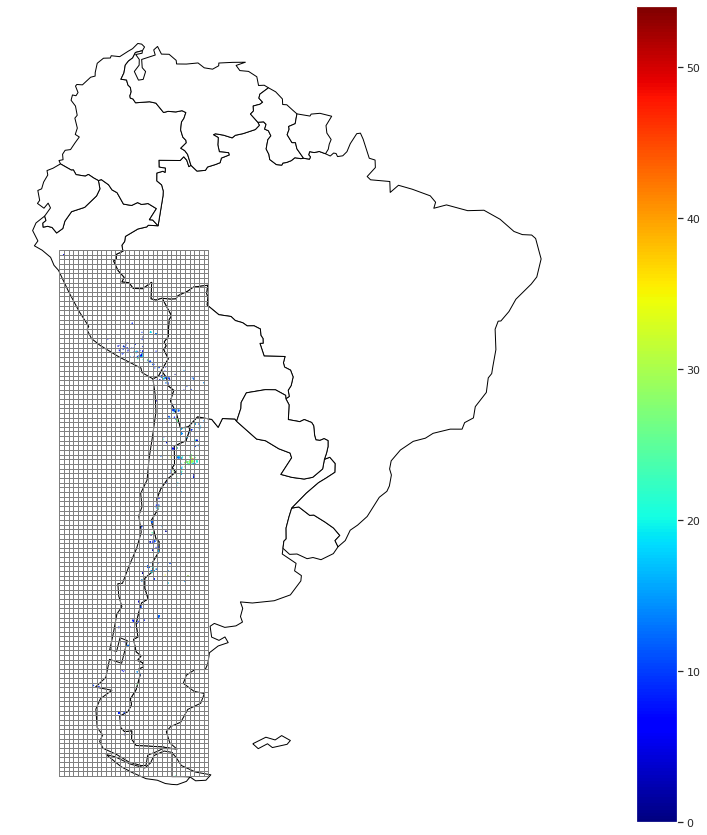

In [26]:

# We restrict to South America.
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

ax = gdf.plot(ax=ax, markersize=.1, figsize=(15, 8), column='TH', cmap='jet',legend=True) #shows points
#plt.autoscale(False) # doesnt really do anything
cell.plot(ax=ax, facecolor="none", edgecolor='grey') # shows grid 
ax.axis("off")


In [37]:
gdf.head()

,SAMPLE ID,SOURCE,REFERENCE,LOC PREC,MATERIAL,TYPE,COMPOSITION,ROCK NAME,TH,geometry,target,id_number
0,080385-4,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",0.01,igneous,volcanic,felsic,dacite,8.60,POINT (-72.493 -41.100),0.0,0
1,230483-3,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",0.01,igneous,volcanic,felsic,dacite,4.30,POINT (-72.493 -41.100),0.0,1
2,PU-02-34,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",0.01,igneous,volcanic,felsic,dacite,8.30,POINT (-72.206 -40.509),0.0,2
3,PU-02-25,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",0.01,igneous,volcanic,felsic,dacite,9.18,POINT (-72.181 -40.528),0.0,3
4,PU-02-20,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",0.01,igneous,volcanic,felsic,dacite,8.82,POINT (-72.174 -40.568),0.0,4


In [44]:
cell

# if element_cell is NaN kernel density estimator

,geometry,element_cell
0,"POLYGON ((-78.945 -54.800, -78.945 -54.373, -7...",NaN
1,"POLYGON ((-78.945 -54.373, -78.945 -53.945, -7...",NaN
2,"POLYGON ((-78.945 -53.945, -78.945 -53.518, -7...",NaN
3,"POLYGON ((-78.945 -53.518, -78.945 -53.091, -7...",NaN
4,"POLYGON ((-78.945 -53.091, -78.945 -52.664, -7...",NaN
...,...,...
3611,"POLYGON ((-65.700 -8.655, -65.700 -8.228, -65....",NaN
3612,"POLYGON ((-65.700 -8.228, -65.700 -7.801, -65....",NaN
3613,"POLYGON ((-65.700 -7.801, -65.700 -7.373, -65....",NaN
3614,"POLYGON ((-65.700 -7.373, -65.700 -6.946, -65....",NaN


In [29]:
merged = geopandas.sjoin(gdf,cell,how ='left',op='within')

In [45]:
# make a simple count variable that we can sum
merged['element_cell']=1
# Compute stats per grid cell -- aggregate fires to grid cells with dissolve
dissolve = merged.dissolve(by="index_right", aggfunc="count")
# put this into cell
cell.loc[dissolve.index, 'element_cell'] = dissolve.element_cell.values

In [46]:
merged

,SAMPLE ID,SOURCE,REFERENCE,LOC PREC,MATERIAL,TYPE,COMPOSITION,ROCK NAME,TH,geometry,target,id_number,index_right,element_cell
0,080385-4,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",0.01,igneous,volcanic,felsic,dacite,8.60,POINT (-72.493 -41.100),0.0,0,1727.0,1
1,230483-3,GEOROC,"HICKEY-VARGAS, R.; HOLBIK, S.; TORMEY, D. R.; ...",0.01,igneous,volcanic,felsic,dacite,4.30,POINT (-72.493 -41.100),0.0,1,1727.0,1
2,PU-02-34,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",0.01,igneous,volcanic,felsic,dacite,8.30,POINT (-72.206 -40.509),0.0,2,1728.0,1
3,PU-02-25,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",0.01,igneous,volcanic,felsic,dacite,9.18,POINT (-72.181 -40.528),0.0,3,1728.0,1
4,PU-02-20,GEOROC,"SINGER, B. S.; JICHA, B. R.; HARPER, M. A.; NA...",0.01,igneous,volcanic,felsic,dacite,8.82,POINT (-72.174 -40.568),0.0,4,1728.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3055,RIG187,GEOROC,"DAVIDSON, J. P.; MCMILLAN, N. J.; MOORBATH, S....",0.01,igneous,volcanic,felsic,rhyolite,18.40,POINT (-69.219 -18.246),0.0,3055,2571.0,1
3056,AJO 017,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",0.01,igneous,volcanic,felsic,rhyolite,4.00,POINT (-69.213 -18.217),0.0,3056,2571.0,1
3057,AJO017,GEOROC,"DAVIDSON, J. P.; MCMILLAN, N. J.; MOORBATH, S....",0.01,igneous,volcanic,felsic,rhyolite,16.30,POINT (-69.219 -18.246),0.0,3057,2571.0,1
3061,CHO 099,GEOROC,"MAMANI, M.; WÖRNER, G.; SEMPERE, T., 2010",0.01,igneous,volcanic,felsic,dacite,5.00,POINT (-69.243 -18.301),0.0,3061,2571.0,1


In [34]:
#testing 

gx, gy, img = interpolate_to_grid(data_all['LONGITUDE'],data_all['LATITUDE'],data_all['TH'], interp_type='linear', hres=75000)
img = np.ma.masked_where(np.isnan(img), img)


img

masked_array(data=[[--]],
             mask=[[ True]],
       fill_value=1e+20,
            dtype=float64)

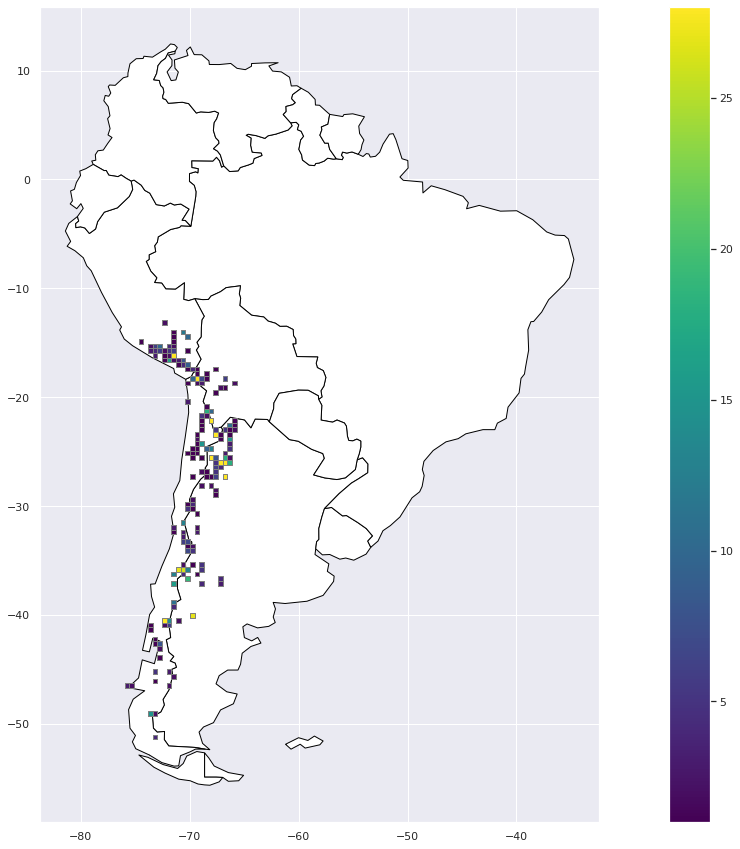

In [51]:
# We restrict to South America.
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

ax = cell.plot(ax=ax,column='element_cell', figsize=(25, 15), cmap='viridis', vmax=28, edgecolor="grey",legend=True)
plt.autoscale(False)
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.to_crs(cell.crs).plot(ax=ax, color='none', edgecolor='black')

plt.show()



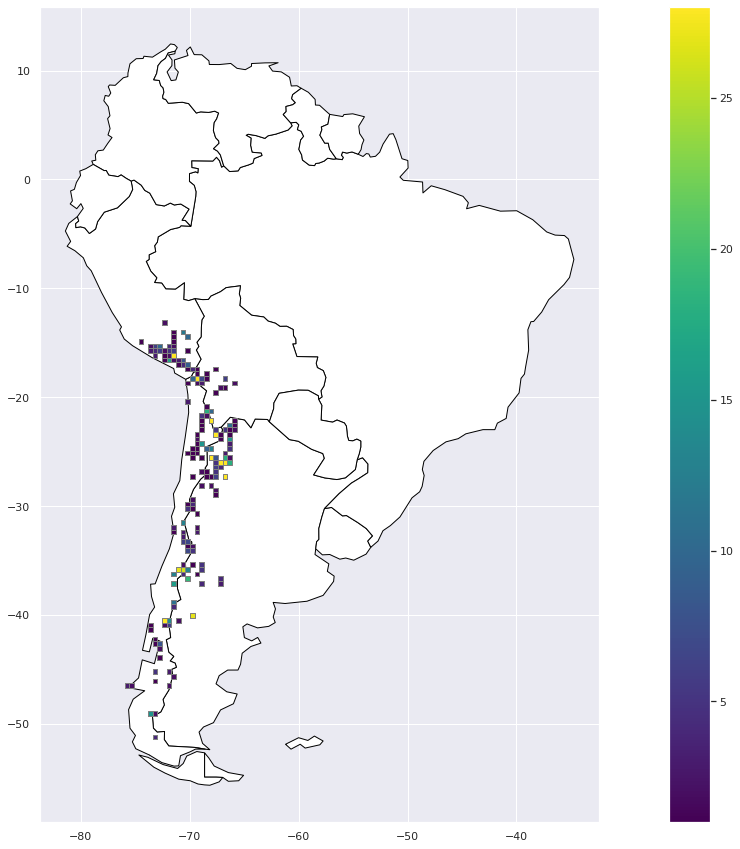

In [50]:
# We restrict to South America.
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
ax = world[world.continent == 'South America'].plot(color="white", edgecolor='black',figsize = (25,15))

ax = cell.plot(ax=ax,column='element_cell', figsize=(25, 15), cmap='viridis', vmax=28, edgecolor="grey",legend=True)
plt.autoscale(False)
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.to_crs(merged.crs).plot(ax=ax, color='none', edgecolor='black')

plt.show()

